In [1]:
!pip install shap
!pip install xgboost
!pip install lime
!pip install tabulate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.9/153.9 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.9/190.9 MB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 1.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=531a77d060b21f907c9fb2b7b3be8647faa665f2d9b03f9947ffd6ca310248c6
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [2]:
!pip install ydata-profiling
!pip install imblearn
!pip install graphviz
!pip install lazypredict
!pip install lightgbm

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.2/356.2 kB 977.4 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 1.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.1/511.1 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.9/233.9 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 4.4 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=d73fab3fe70b7c4651917c004557f7f60b3c826f1e0d73acc552ba02ba5a0de8
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import lazypredict

import warnings
warnings.filterwarnings('ignore')

from sklearn import tree
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc, classification_report

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks
from imblearn.pipeline import Pipeline
from sklearn.inspection import permutation_importance
from sklearn.tree import export_graphviz
import graphviz
from ydata_profiling import ProfileReport
from sklearn.preprocessing import OneHotEncoder
import shap
from imblearn.combine import SMOTEENN
import xgboost
import lightgbm as lgb
from sklearn.inspection import PartialDependenceDisplay
from lime.lime_tabular import LimeTabularExplainer
from sklearn.metrics import roc_auc_score


In [4]:
# Load the dataset
df = pd.read_csv('diabetes_012_health_indicators_BRFSS2015.csv')


# Explore the dataset
df.head()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0


In [5]:
# Get the number of duplicate records
num_duplicates = df.duplicated().sum()

# Print the number of duplicate records
print(f"Number of duplicate records: {num_duplicates}")

# Remove duplicates directly from the original DataFrame
df.drop_duplicates(inplace=True)

Number of duplicate records: 23899


In [6]:
df.shape

(229781, 22)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 229781 entries, 0 to 253679
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Diabetes_012          229781 non-null  float64
 1   HighBP                229781 non-null  float64
 2   HighChol              229781 non-null  float64
 3   CholCheck             229781 non-null  float64
 4   BMI                   229781 non-null  float64
 5   Smoker                229781 non-null  float64
 6   Stroke                229781 non-null  float64
 7   HeartDiseaseorAttack  229781 non-null  float64
 8   PhysActivity          229781 non-null  float64
 9   Fruits                229781 non-null  float64
 10  Veggies               229781 non-null  float64
 11  HvyAlcoholConsump     229781 non-null  float64
 12  AnyHealthcare         229781 non-null  float64
 13  NoDocbcCost           229781 non-null  float64
 14  GenHlth               229781 non-null  float64
 15  MentH

In [8]:
# Check for missing values
print(df.isnull().sum())

Diabetes_012            0
HighBP                  0
HighChol                0
CholCheck               0
BMI                     0
Smoker                  0
Stroke                  0
HeartDiseaseorAttack    0
PhysActivity            0
Fruits                  0
Veggies                 0
HvyAlcoholConsump       0
AnyHealthcare           0
NoDocbcCost             0
GenHlth                 0
MentHlth                0
PhysHlth                0
DiffWalk                0
Sex                     0
Age                     0
Education               0
Income                  0
dtype: int64


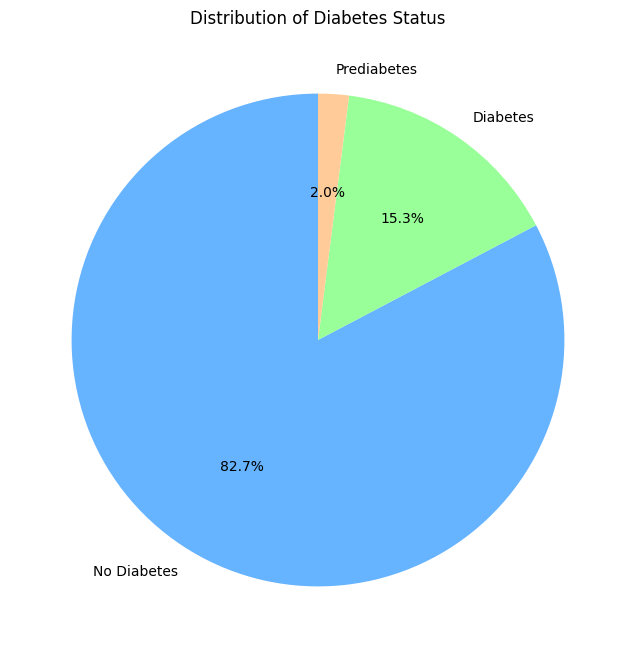

In [9]:
# Value counts
value_counts = df['Diabetes_012'].value_counts()

# Mapping the values to labels
labels = {0: 'No Diabetes', 1: 'Prediabetes', 2: 'Diabetes'}
df['Diabetes_012_label'] = df['Diabetes_012'].map(labels)

# Pie chart for distribution
plt.figure(figsize=(8, 8))
df['Diabetes_012_label'].value_counts().plot.pie(autopct='%1.1f%%', startangle=90, colors=['#66b3ff','#99ff99','#ffcc99'])
plt.title('Distribution of Diabetes Status')
plt.ylabel('')
plt.show()

**Let us combine the prediabetic with diabetic**

In [10]:
# Map the values
df['Diabetes_012'] = df['Diabetes_012'].replace({0: 0, 1: 1, 2: 1})
df.head()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,Diabetes_012_label
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,...,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0,No Diabetes
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,...,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0,No Diabetes
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,...,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0,No Diabetes
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0,No Diabetes
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0,No Diabetes


In [11]:
# Value counts
value_counts = df['Diabetes_012'].value_counts()
print(value_counts)

Diabetes_012
0.0    190055
1.0     39726
Name: count, dtype: int64


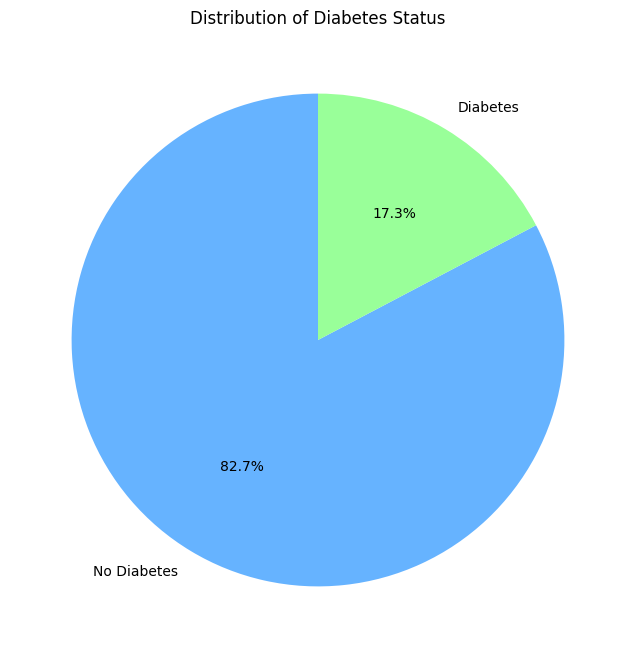

In [12]:
# Value counts
value_counts = df['Diabetes_012'].value_counts()

# Mapping the values to labels
labels = {0: 'No Diabetes', 1: 'Diabetes'}
df['Diabetes_012_label'] = df['Diabetes_012'].map(labels)

# Pie chart for distribution
plt.figure(figsize=(8, 8))
df['Diabetes_012_label'].value_counts().plot.pie(autopct='%1.1f%%', startangle=90, colors=['#66b3ff','#99ff99','#ffcc99'])
plt.title('Distribution of Diabetes Status')
plt.ylabel('')
plt.show()

In [13]:
if 'Diabetes_012_label' in df.columns:
    df = df.drop(columns=['Diabetes_012_label'])

In [14]:
report = ProfileReport(
    df,
    title="Diabetic Health Indicator",
    explorative=True,
    minimal=True,
    html={'style': {'full_width': True}},
)
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Alert from data profiling guardrails**

CholCheck is highly imbalanced (75.6%)	Imbalance

Stroke is highly imbalanced (73.6%)	Imbalance

HeartDiseaseorAttack is highly imbalanced (52.1%)	Imbalance

HvyAlcoholConsump is highly imbalanced (67.0%)	Imbalance

AnyHealthcare is highly imbalanced (69.7%)	Imbalance

NoDocbcCost is highly imbalanced (55.4%)	Imbalance

MentHlth has 152623 (66.4%) Zeros

PhysHlth has 136877 (59.6%) zeros

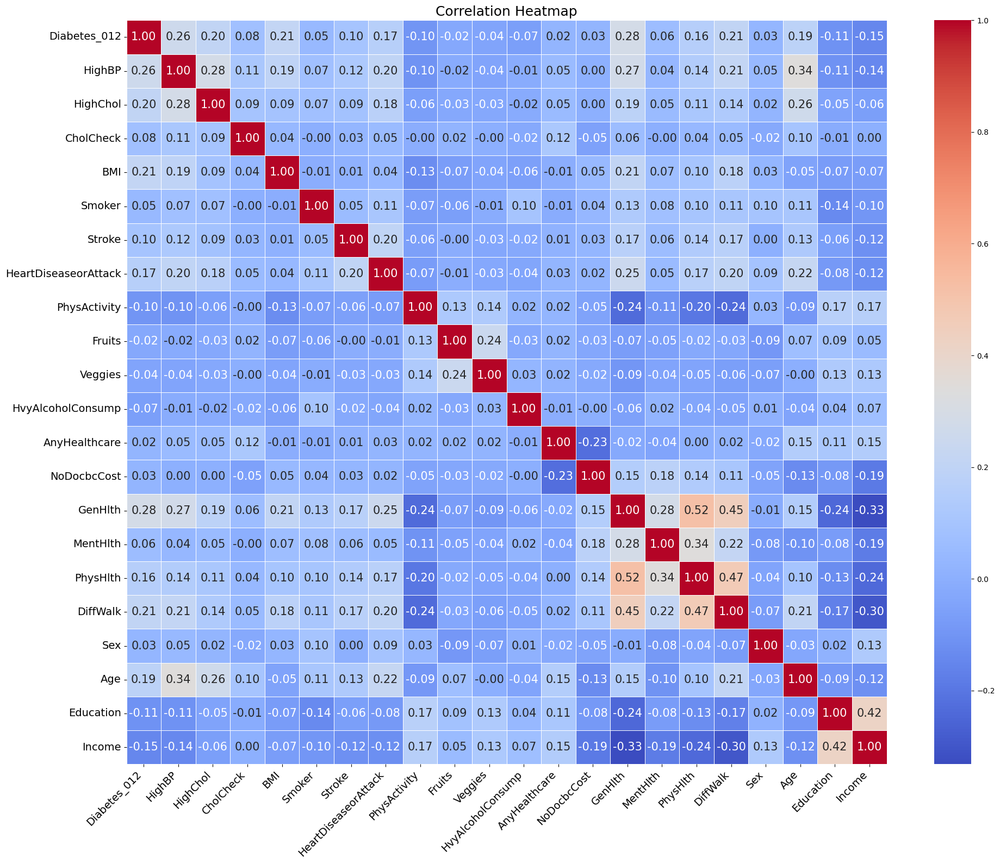

In [15]:
# Correlation matrix
correlation_matrix = df.corr()

# Plotting the correlation heatmap with adjusted figure size and layout
plt.figure(figsize=(20, 16))  # Increase the figure size
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, annot_kws={"size": 15})  # Increase annotation size
plt.title('Correlation Heatmap', fontsize=18)
plt.xticks(rotation=45, ha='right', fontsize=14)  # Rotate x-axis labels for better visibility
plt.yticks(fontsize=14)  # Adjust y-axis label size
plt.tight_layout()  # Adjust the layout to fit everything
plt.savefig('correlation_heatmap_updated.png')
plt.show()

Here are our observation from the corelation matrix:

Education and Income are highly corelated. This is expected as income and education is generally propotional.

All three general, mental, and physical health is negatively corelation. This implies with higher income/education general, mental, and physical health improved. (Note the scale to define general, mental, and physical health is such that lower number indicate better health). This is expected as higher income/education has higher awareness and access to better healthcare

Age is higly corelated to High BP and High Collestrol. Again something that goes hand in hand

In [16]:
import pandas as pd
from scipy.stats import chi2_contingency


target_column = 'Diabetes_012'

# Dictionary to store the Chi-Square test results
chi_square_results = {}

# Perform Chi-Square test
for feature in df.columns:
    if feature != target_column:
        contingency_table = pd.crosstab(df[feature], df[target_column])
        chi2, p, dof, expected = chi2_contingency(contingency_table)
        chi_square_results[feature] = {
            'Chi-Square Statistic': chi2,
            'P-value': p,
            'Degrees of Freedom': dof,
            'Expected Frequencies': expected
        }

# Sort the results by Chi-Square Statistic in descending order
sorted_results = sorted(chi_square_results.items(), key=lambda item: item[1]['Chi-Square Statistic'], reverse=True)



# Create a DataFrame for the sorted results
results_df = pd.DataFrame(
    [(feature, results['Chi-Square Statistic']) for feature, results in sorted_results],
    columns=['Feature', 'Chi-Square Score']
)

# Format the DataFrame for better readability
pd.set_option('display.float_format', '{:.2f}'.format)  # Set float format
results_df.index += 1  # Start index at 1 for better presentation

# Display the results as a table
print("Chi-Square Test Results:")
print("=============================================")
print(results_df.to_markdown(index=False))  # Use markdown for attractive display
print("=============================================")


Chi-Square Test Results:
| Feature              |   Chi-Square Score |
|:---------------------|-------------------:|
| GenHlth              |          18893.5   |
| HighBP               |          15573.2   |
| BMI                  |          12791.5   |
| DiffWalk             |           9951.88  |
| HighChol             |           9600.74  |
| Age                  |           8877.51  |
| HeartDiseaseorAttack |           6421.03  |
| PhysHlth             |           6250.03  |
| Income               |           5115.86  |
| Education            |           2832.88  |
| PhysActivity         |           2408.39  |
| Stroke               |           2191.4   |
| CholCheck            |           1332.84  |
| MentHlth             |           1254.43  |
| HvyAlcoholConsump    |           1003.56  |
| Smoker               |            491.535 |
| Veggies              |            431.299 |
| Sex                  |            217.779 |
| NoDocbcCost          |            154.38  |
| Fruits 

In [17]:
## Removing columns based on Corelation Analysis, Guardrials and Chi Square Test Result
if 'Education' in df.columns:
    df = df.drop(columns=['Education'])

if 'CholCheck' in df.columns:
    df = df.drop(columns=['CholCheck'])

if 'Stroke' in df.columns:
    df = df.drop(columns=['Stroke'])

if 'HvyAlcoholConsump' in df.columns:
    df = df.drop(columns=['HvyAlcoholConsump'])

if 'MentHlth' in df.columns:
    df = df.drop(columns=['MentHlth'])

if 'AnyHealthcare' in df.columns:
    df = df.drop(columns=['AnyHealthcare'])

if 'NoDocbcCost' in df.columns:
    df = df.drop(columns=['NoDocbcCost'])


if 'HeartDiseaseorAttack' in df.columns:
    df = df.drop(columns=['HeartDiseaseorAttack'])

if 'DiffWalk' in df.columns:
    df = df.drop(columns=['DiffWalk'])

if 'PhysHlth' in df.columns:
    df = df.drop(columns=['PhysHlth'])




In [18]:
df.head()

,Diabetes_012,HighBP,HighChol,BMI,Smoker,PhysActivity,Fruits,Veggies,GenHlth,Sex,Age,Income
0,0.00,1.00,1.00,40.00,1.00,0.00,0.00,1.00,5.00,0.00,9.00,3.00
1,0.00,0.00,0.00,25.00,1.00,1.00,0.00,0.00,3.00,0.00,7.00,1.00
2,0.00,1.00,1.00,28.00,0.00,0.00,1.00,0.00,5.00,0.00,9.00,8.00
3,0.00,1.00,0.00,27.00,0.00,1.00,1.00,1.00,2.00,0.00,11.00,6.00
4,0.00,1.00,1.00,24.00,0.00,1.00,1.00,1.00,2.00,0.00,11.00,4.00




---


**Feature Engineering to convert BMI category to numeric value**

Feature Engineering - BMI

The below is the obesity criteria based on BMI:

Below 18.5 Underweight

18.5—24.9 Healthy Weight

25.0—29.9 Overweight

30.0 and Above Obesity

We will use the same for encoding.

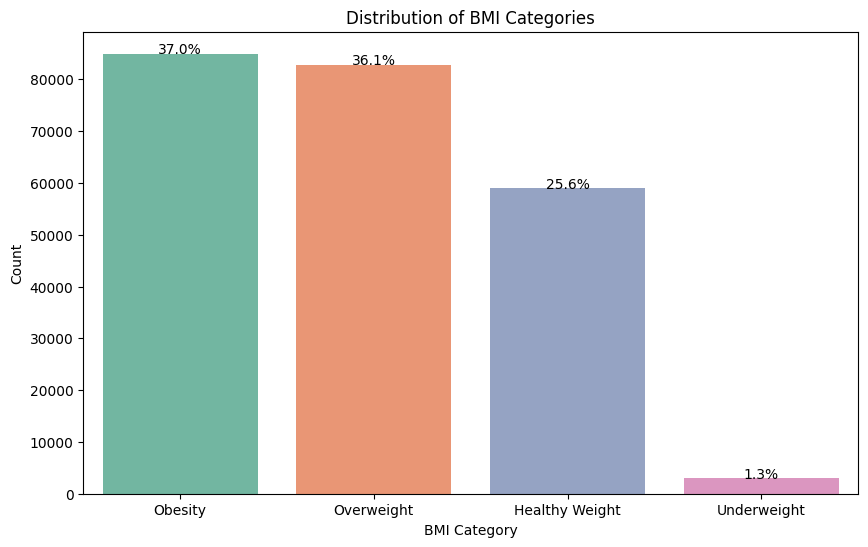

In [19]:
# Define a function to encode the BMI values
def encode_bmi(bmi):
    if bmi < 18.5:
        return 'Underweight'
    elif 18.5 <= bmi <= 24.9:
        return 'Healthy Weight'
    elif 25.0 <= bmi <= 29.9:
        return 'Overweight'
    else:
        return 'Obesity'

# Apply the function to create a new column 'BMI_Category'
df['BMI_Category'] = df['BMI'].apply(encode_bmi)

# Calculate the percentage for each BMI category
category_counts = df['BMI_Category'].value_counts()
category_percentages = category_counts / category_counts.sum() * 100

# Display the distribution of BMI categories with percentages
plt.figure(figsize=(10, 6))
ax = sns.countplot(x='BMI_Category', data=df, palette='Set2', order=category_counts.index)
plt.title('Distribution of BMI Categories')
plt.xlabel('BMI Category')
plt.ylabel('Count')

# Add percentage labels to the bars
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2.,
            height + 3,
            '{:1.1f}%'.format(height / len(df) * 100),
            ha="center")

plt.show()

<Figure size 1000x600 with 0 Axes>

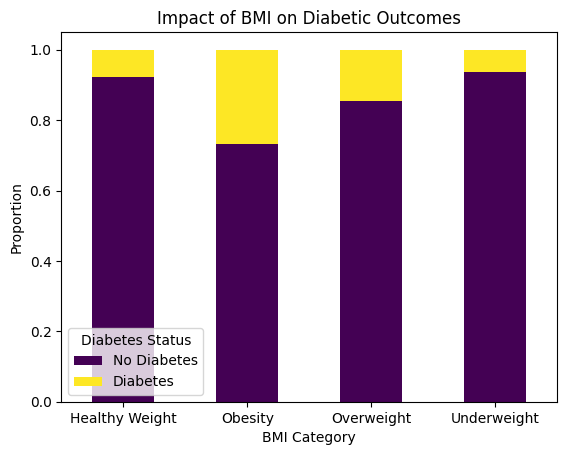

In [20]:
# Create a crosstab to see the relationship between BMI categories and diabetic outcomes
crosstab = pd.crosstab(df['BMI_Category'], df['Diabetes_012'], normalize='index')

# Rename columns for clarity
crosstab.columns = ['No Diabetes', 'Diabetes']

# Plot the crosstab as a bar plot
plt.figure(figsize=(10, 6))
crosstab.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Impact of BMI on Diabetic Outcomes')
plt.xlabel('BMI Category')
plt.ylabel('Proportion')
plt.legend(title='Diabetes Status')
plt.xticks(rotation=0)
plt.show()

In [21]:
# One-hot encode the BMI categories
one_hot_encoded = pd.get_dummies(df['BMI_Category'], prefix='bmi')

# Concatenate the one-hot encoded columns with the original dataframe
df = pd.concat([df, one_hot_encoded], axis=1)

df.head()

,Diabetes_012,HighBP,HighChol,BMI,Smoker,PhysActivity,Fruits,Veggies,GenHlth,Sex,Age,Income,BMI_Category,bmi_Healthy Weight,bmi_Obesity,bmi_Overweight,bmi_Underweight
0,0.00,1.00,1.00,40.00,1.00,0.00,0.00,1.00,5.00,0.00,9.00,3.00,Obesity,False,True,False,False
1,0.00,0.00,0.00,25.00,1.00,1.00,0.00,0.00,3.00,0.00,7.00,1.00,Overweight,False,False,True,False
2,0.00,1.00,1.00,28.00,0.00,0.00,1.00,0.00,5.00,0.00,9.00,8.00,Overweight,False,False,True,False
3,0.00,1.00,0.00,27.00,0.00,1.00,1.00,1.00,2.00,0.00,11.00,6.00,Overweight,False,False,True,False
4,0.00,1.00,1.00,24.00,0.00,1.00,1.00,1.00,2.00,0.00,11.00,4.00,Healthy Weight,True,False,False,False


In [22]:
if 'BMI' in df.columns:
    df = df.drop(columns=['BMI'])
if 'BMI_Category' in df.columns:
    df = df.drop(columns=['BMI_Category'])

df.head()


,Diabetes_012,HighBP,HighChol,Smoker,PhysActivity,Fruits,Veggies,GenHlth,Sex,Age,Income,bmi_Healthy Weight,bmi_Obesity,bmi_Overweight,bmi_Underweight
0,0.00,1.00,1.00,1.00,0.00,0.00,1.00,5.00,0.00,9.00,3.00,False,True,False,False
1,0.00,0.00,0.00,1.00,1.00,0.00,0.00,3.00,0.00,7.00,1.00,False,False,True,False
2,0.00,1.00,1.00,0.00,0.00,1.00,0.00,5.00,0.00,9.00,8.00,False,False,True,False
3,0.00,1.00,0.00,0.00,1.00,1.00,1.00,2.00,0.00,11.00,6.00,False,False,True,False
4,0.00,1.00,1.00,0.00,1.00,1.00,1.00,2.00,0.00,11.00,4.00,True,False,False,False


##**Feature Engineer General Health**

As per CDC the general health is defined as "Would you say that in general your health is: scale 1-5 1 = excellent 2 = very good 3 = good 4 = fair 5 = poor"

We want to reverse the scale to make it more intuitive

In [23]:
# Create the mapping
genhlth_mapping = {1: 5, 2: 4, 3: 3, 4: 2, 5: 1}

# Apply the mapping to the 'GenHlth' column to create a new column 'GenHlth_Reversed'
df['GenHlth_Reversed'] = df['GenHlth'].map(genhlth_mapping)

# Drop the original 'GenHlth' column and rename the reversed column to 'GenHlth'
df.drop(columns=['GenHlth'], inplace=True)
df.rename(columns={'GenHlth_Reversed': 'GenHlth'}, inplace=True)

# Display the updated DataFrame
print(df.head())

   Diabetes_012  HighBP  HighChol  Smoker  PhysActivity  Fruits  Veggies  Sex  \
0          0.00    1.00      1.00    1.00          0.00    0.00     1.00 0.00   
1          0.00    0.00      0.00    1.00          1.00    0.00     0.00 0.00   
2          0.00    1.00      1.00    0.00          0.00    1.00     0.00 0.00   
3          0.00    1.00      0.00    0.00          1.00    1.00     1.00 0.00   
4          0.00    1.00      1.00    0.00          1.00    1.00     1.00 0.00   

    Age  Income  bmi_Healthy Weight  bmi_Obesity  bmi_Overweight  \
0  9.00    3.00               False         True           False   
1  7.00    1.00               False        False            True   
2  9.00    8.00               False        False            True   
3 11.00    6.00               False        False            True   
4 11.00    4.00                True        False           False   

   bmi_Underweight  GenHlth  
0            False        1  
1            False        3  
2            F

<Figure size 1000x600 with 0 Axes>

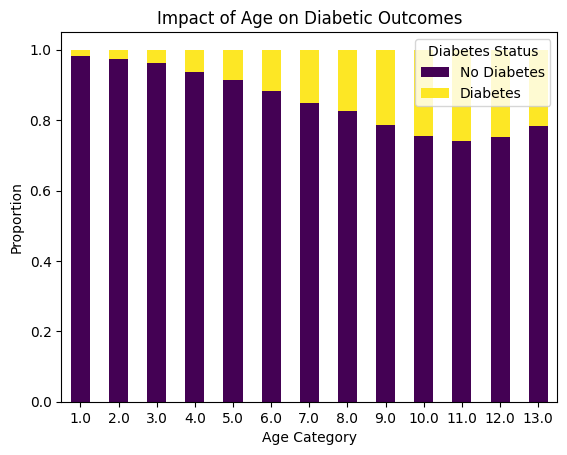

In [24]:
# Create a crosstab to see the relationship between Age categories and diabetic outcomes
crosstab = pd.crosstab(df['Age'], df['Diabetes_012'], normalize='index')

# Rename columns for clarity
crosstab.columns = ['No Diabetes', 'Diabetes']

# Plot the crosstab as a bar plot
plt.figure(figsize=(10, 6))
crosstab.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Impact of Age on Diabetic Outcomes')
plt.xlabel('Age Category')
plt.ylabel('Proportion')
plt.legend(title='Diabetes Status')
plt.xticks(rotation=0)
plt.show()

<Figure size 1000x600 with 0 Axes>

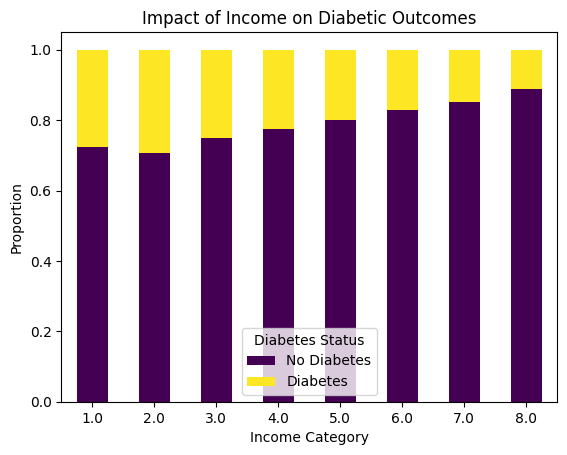

In [25]:
# Create a crosstab to see the relationship between Age categories and diabetic outcomes
crosstab = pd.crosstab(df['Income'], df['Diabetes_012'], normalize='index')

# Rename columns for clarity
crosstab.columns = ['No Diabetes','Diabetes']

# Plot the crosstab as a bar plot
plt.figure(figsize=(10, 6))
crosstab.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Impact of Income on Diabetic Outcomes')
plt.xlabel('Income Category')
plt.ylabel('Proportion')
plt.legend(title='Diabetes Status')
plt.xticks(rotation=0)
plt.show()

<Figure size 1000x600 with 0 Axes>

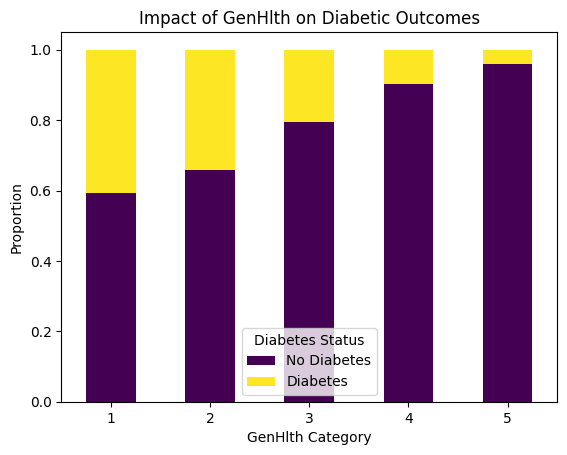

In [26]:
# Create a crosstab to see the relationship between Age categories and diabetic outcomes
crosstab = pd.crosstab(df['GenHlth'], df['Diabetes_012'], normalize='index')

# Rename columns for clarity
crosstab.columns = ['No Diabetes', 'Diabetes']

# Plot the crosstab as a bar plot
plt.figure(figsize=(10, 6))
crosstab.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Impact of GenHlth on Diabetic Outcomes')
plt.xlabel('GenHlth Category')
plt.ylabel('Proportion')
plt.legend(title='Diabetes Status')
plt.xticks(rotation=0)
plt.show()

<Figure size 1600x600 with 0 Axes>

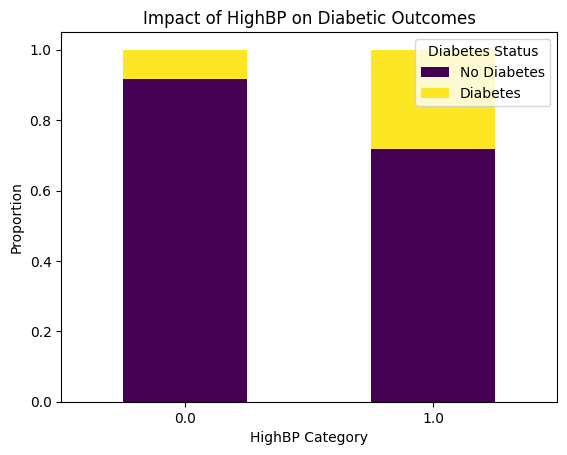

In [27]:
# Create a crosstab to see the relationship between Age categories and diabetic outcomes
crosstab = pd.crosstab(df['HighBP'], df['Diabetes_012'], normalize='index')

# Rename columns for clarity
crosstab.columns = ['No Diabetes', 'Diabetes']

# Plot the crosstab as a bar plot
plt.figure(figsize=(16, 6))
crosstab.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Impact of HighBP on Diabetic Outcomes')
plt.xlabel('HighBP Category')
plt.ylabel('Proportion')
plt.legend(title='Diabetes Status')
plt.xticks(rotation=0)
plt.show()

<Figure size 1600x600 with 0 Axes>

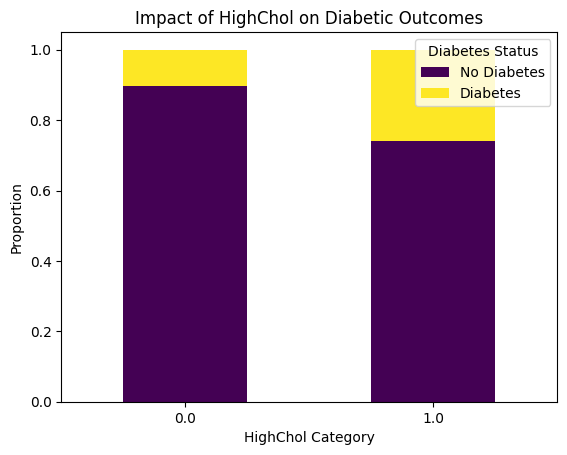

In [28]:
# Create a crosstab to see the relationship between Age categories and diabetic outcomes
crosstab = pd.crosstab(df['HighChol'], df['Diabetes_012'], normalize='index')

# Rename columns for clarity
crosstab.columns = ['No Diabetes', 'Diabetes']

# Plot the crosstab as a bar plot
plt.figure(figsize=(16, 6))
crosstab.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Impact of HighChol on Diabetic Outcomes')
plt.xlabel('HighChol Category')
plt.ylabel('Proportion')
plt.legend(title='Diabetes Status')
plt.xticks(rotation=0)
plt.show()

##**Baseline Model with data stratification**


This section was part of our failed experimentation. Please go to the "New Approach"

In [ ]:
class_counts = df['Diabetes_012'].value_counts()
print("Class Distribution:\n", class_counts)
# Identify the minority class (the class with the minimum count)
minority_class = class_counts.idxmin()
minority_class_count = class_counts.min()
print(f"Minority Class: {minority_class} with {minority_class_count} rows")

# Set the minimum number of rows for the minority class
min_class_count = minority_class_count

# Create a stratified sample dataframe
df_stratified = df.groupby('Diabetes_012', group_keys=False).apply(lambda x: x.sample(min_class_count))

# Shuffle the new dataframe to mix up the classes
df_stratified = df_stratified.sample(frac=1).reset_index(drop=True)

print(df_stratified['Diabetes_012'].value_counts())

Class Distribution:
 Diabetes_012
0.0    190055
1.0     39726
Name: count, dtype: int64
Minority Class: 1.0 with 39726 rows
Diabetes_012
1.0    39726
0.0    39726
Name: count, dtype: int64


In [ ]:
# Separate features and target variable
X_stratified = df_stratified.drop(columns=['Diabetes_012'])
y_stratified = df_stratified['Diabetes_012']

# Split the data into training and testing sets
X_train_stratified, X_test_stratified, y_train_stratified, y_test_stratified = train_test_split(X_stratified, y_stratified, test_size=0.2, random_state=42)

## standardize features
scaler = StandardScaler()
X_train_scaled_stratified = scaler.fit_transform(X_train_stratified)
X_test_scaled_stratified = scaler.transform(X_test_stratified)

In [ ]:
X_stratified.head()

,HighBP,HighChol,Smoker,PhysActivity,Fruits,Veggies,Age,Income,bmi_Healthy Weight,bmi_Obesity,bmi_Overweight,bmi_Underweight,GenHlth,Sex_female,Sex_male
0,1.0,1.0,1.0,1.0,1.0,1.0,11.0,7.0,False,True,False,False,3,False,True
1,0.0,0.0,1.0,1.0,0.0,1.0,8.0,8.0,True,False,False,False,3,False,True
2,0.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,False,False,True,False,4,True,False
3,0.0,0.0,1.0,0.0,1.0,1.0,10.0,7.0,True,False,False,False,4,True,False
4,0.0,0.0,0.0,1.0,1.0,1.0,7.0,7.0,False,False,True,False,3,False,True


In [ ]:
# Check for missing values
print(X_stratified.isnull().sum())

HighBP                0
HighChol              0
Smoker                0
PhysActivity          0
Fruits                0
Veggies               0
Age                   0
Income                0
bmi_Healthy Weight    0
bmi_Obesity           0
bmi_Overweight        0
bmi_Underweight       0
GenHlth               0
Sex_female            0
Sex_male              0
dtype: int64


### Model Evaluation

#### Decision Tree

In [ ]:
# Initialize and train the Desicion Tree Classifier with no class balancing
dt_classifier_stratified = DecisionTreeClassifier(random_state=42)
dt_classifier_stratified.fit(X_train_scaled_stratified, y_train_stratified)

DecisionTreeClassifier(random_state=42)

Confusion Matrix:


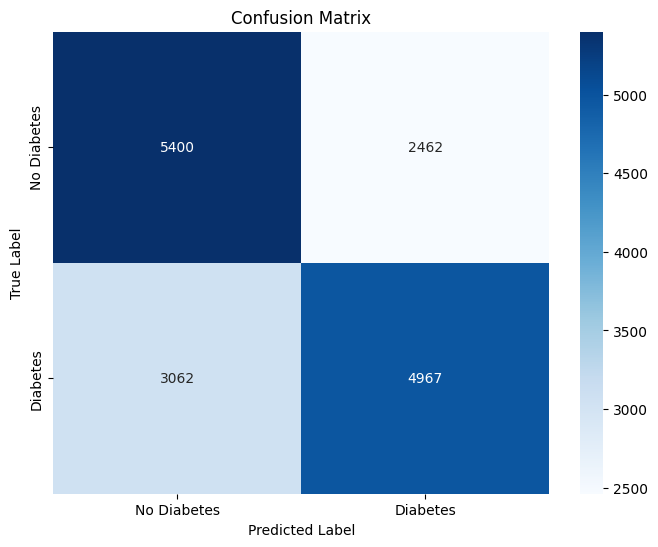


Classification Report:
              precision    recall  f1-score   support

 No Diabetes       0.64      0.69      0.66      7862
    Diabetes       0.67      0.62      0.64      8029

    accuracy                           0.65     15891
   macro avg       0.65      0.65      0.65     15891
weighted avg       0.65      0.65      0.65     15891


Accuracy Score: 65.23818513624063


In [ ]:
# Predict on the test set
y_pred = dt_classifier_stratified.predict(X_test_scaled_stratified)

# Evaluate the model
print("Confusion Matrix:")
conf_matrix = confusion_matrix(y_test_stratified, y_pred)
# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Diabetes', 'Diabetes'],
            yticklabels=['No Diabetes', 'Diabetes'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()
print("\nClassification Report:")
print(classification_report(y_test_stratified, y_pred, target_names=['No Diabetes',  'Diabetes']))
print("\nAccuracy Score:", accuracy_score(y_test_stratified, y_pred) * 100)

**Running Grid Search**

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
params_grid_dt = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [5, 10, 15, 20],
    'min_samples_leaf': [1, 2, 5]
}
# Define the model
model_dt = DecisionTreeClassifier(random_state=123)

grid_search_dt = GridSearchCV(estimator = model_dt,
                        param_grid = params_grid_dt,
                        scoring='accuracy',
                        cv = 5, verbose = 1, n_jobs = -1)
grid_search_dt.fit(X_train_scaled_stratified, y_train_stratified.values.ravel())
best_params_dt = grid_search_dt.best_params_
print(best_params_dt)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
{'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 2}


Best parameters found:  {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 2}
Confusion Matrix:


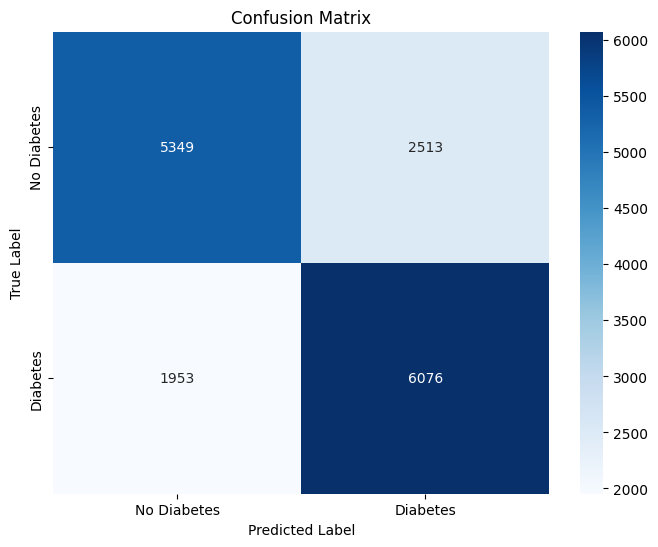


Classification Report:
              precision    recall  f1-score   support

 No Diabetes       0.73      0.68      0.71      7862
    Diabetes       0.71      0.76      0.73      8029

    accuracy                           0.72     15891
   macro avg       0.72      0.72      0.72     15891
weighted avg       0.72      0.72      0.72     15891


Accuracy Score: 0.7189604178465798


In [ ]:
# Extract the best parameters and model
best_params_dt = grid_search_dt.best_params_
best_model_dt = grid_search_dt.best_estimator_

print("Best parameters found: ", best_params_dt)

# Predict on the test set
y_pred = best_model_dt.predict(X_test_scaled_stratified)

# Evaluate the model
print("Confusion Matrix:")
conf_matrix = confusion_matrix(y_test_stratified, y_pred)
# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Diabetes', 'Diabetes'],
            yticklabels=['No Diabetes', 'Diabetes'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()
print("\nClassification Report:")
print(classification_report(y_test_stratified, y_pred, target_names=['No Diabetes',  'Diabetes']))
print("\nAccuracy Score:", accuracy_score(y_test_stratified, y_pred))

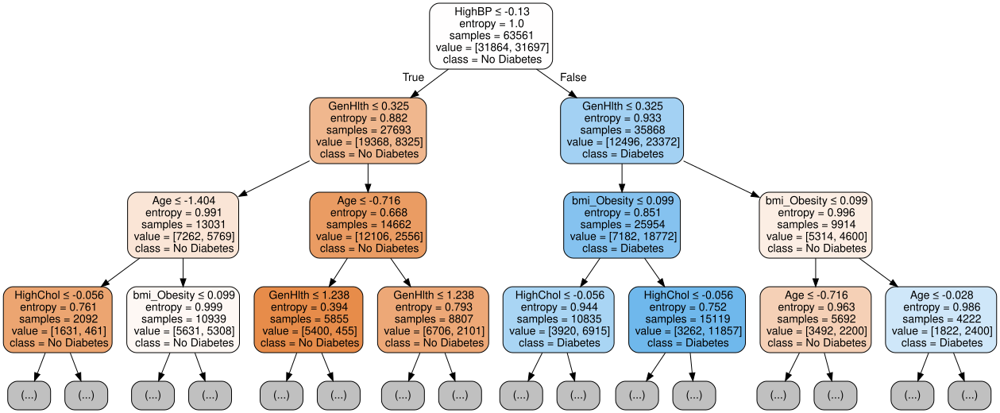

In [ ]:
# Export the tree in DOT format
dot_data = export_graphviz(best_model_dt,
                           out_file=None,
                           filled=True,
                           rounded=True,
                           special_characters=True,
                           feature_names=X_stratified.columns,
                           class_names=['No Diabetes', 'Diabetes'],
                           max_depth=3)  # Adjust the depth for readability

# Visualize the tree
graph = graphviz.Source(dot_data)
graph.render("decision_tree")  # This will create a PDF file with the tree
graph

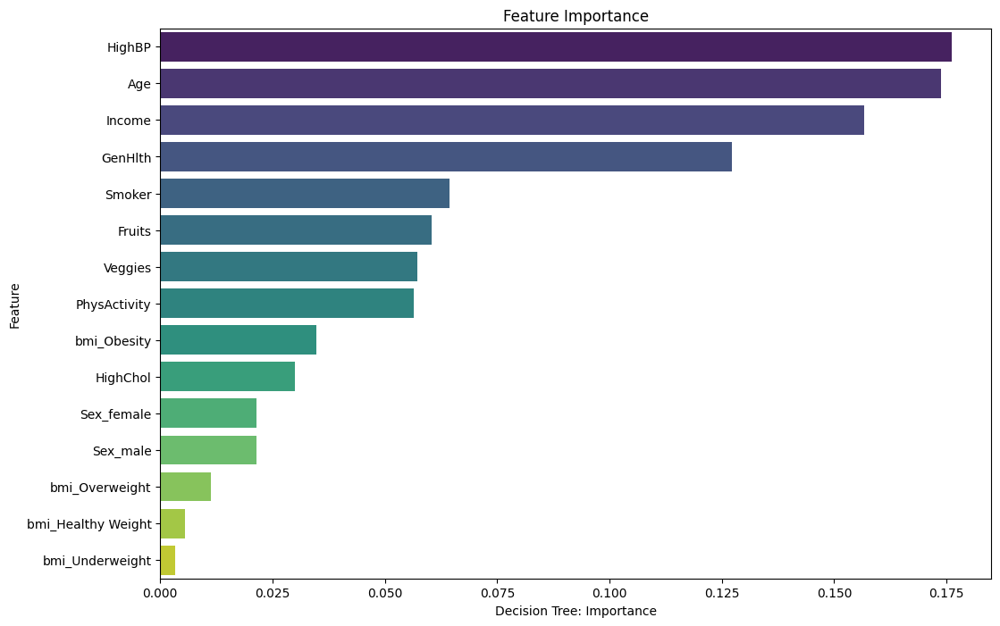

In [ ]:
# Feature importance
importances = dt_classifier_stratified.feature_importances_
feature_names = X_stratified.columns

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.title('Feature Importance')
plt.xlabel('Decision Tree: Importance')
plt.ylabel('Feature')
plt.show()

**PFI**

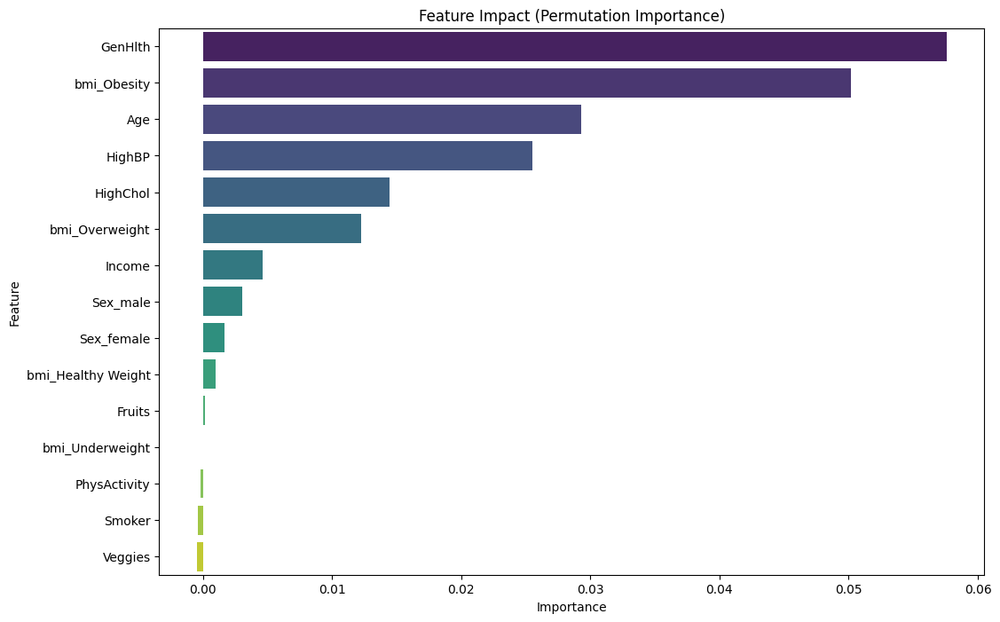

In [ ]:
# Compute permutation importance
results = permutation_importance(best_model_dt, X_test_scaled_stratified, y_test_stratified, scoring='recall_macro')

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': X_stratified.columns,
    'Importance': results.importances_mean
}).sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.title('Feature Impact (Permutation Importance)')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

**PDP**

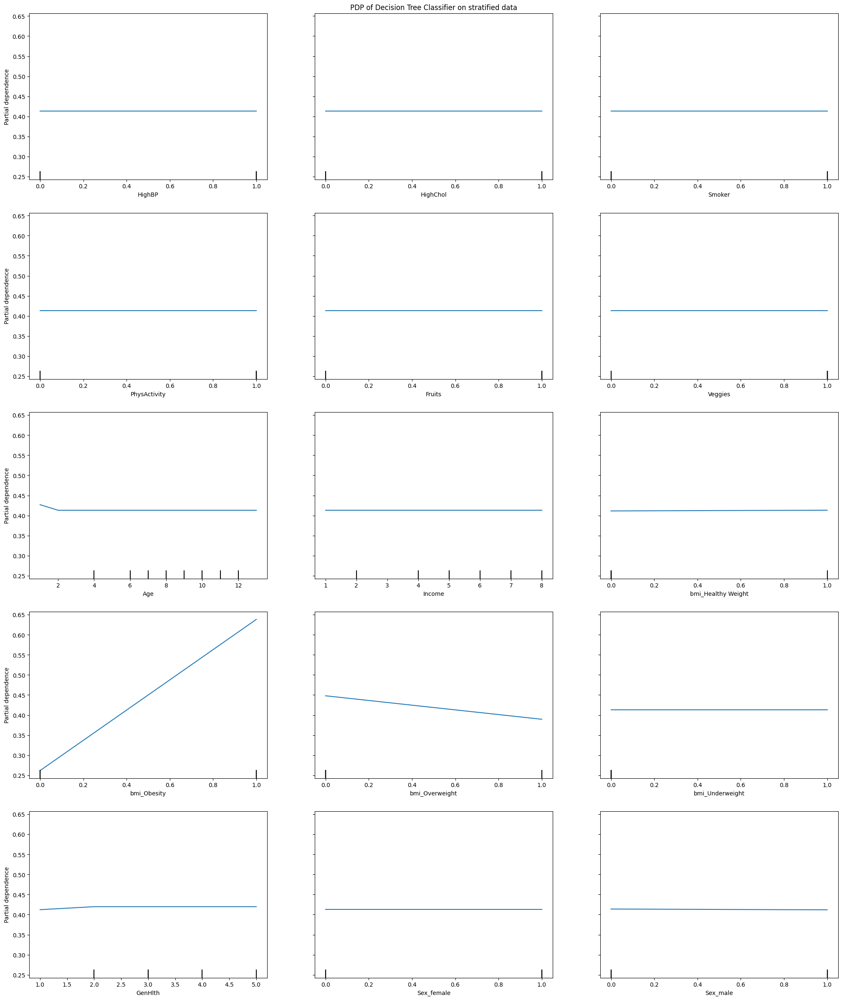

In [ ]:
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay

fig, ax = plt.subplots(figsize=(25, 30))
plt.title('PDP of Decision Tree Classifier on stratified data')
PartialDependenceDisplay.from_estimator(
    estimator=best_model_dt,
    X=X_train_stratified,
    features=X_stratified.columns, # the features to plot
    #categorical_features = (2, 3), # categorical features
    random_state=42,
    ax=ax,
)
plt.show()

**SHapley Additive exPlanations (SHAP)**

In [ ]:
X_test_stratified.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15891 entries, 53423 to 55697
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   HighBP              15891 non-null  float64
 1   HighChol            15891 non-null  float64
 2   Smoker              15891 non-null  float64
 3   PhysActivity        15891 non-null  float64
 4   Fruits              15891 non-null  float64
 5   Veggies             15891 non-null  float64
 6   Age                 15891 non-null  float64
 7   Income              15891 non-null  float64
 8   bmi_Healthy Weight  15891 non-null  bool   
 9   bmi_Obesity         15891 non-null  bool   
 10  bmi_Overweight      15891 non-null  bool   
 11  bmi_Underweight     15891 non-null  bool   
 12  GenHlth             15891 non-null  int64  
 13  Sex_female          15891 non-null  bool   
 14  Sex_male            15891 non-null  bool   
dtypes: bool(6), float64(8), int64(1)
memory usage: 1.3 MB


In [ ]:
X_test_stratified = X_test_stratified.astype(int)
X_test_stratified_sampled = X_test_stratified.sample(n=100, random_state=42)
X_test_stratified_sampled.head()

,HighBP,HighChol,Smoker,PhysActivity,Fruits,Veggies,Age,Income,bmi_Healthy Weight,bmi_Obesity,bmi_Overweight,bmi_Underweight,GenHlth,Sex_female,Sex_male
39527,0,0,0,1,1,1,1,8,0,0,1,0,5,0,1
40153,1,1,1,0,1,1,12,2,0,1,0,0,3,0,1
9203,0,1,0,1,1,1,12,3,0,0,1,0,4,1,0
64631,0,0,0,0,1,0,9,8,0,0,1,0,3,0,1
25253,1,1,1,1,0,0,12,5,0,1,0,0,2,0,1


In [ ]:
# Fits the explainer
explainer = shap.Explainer(best_model_dt.predict, X_test_stratified_sampled)
# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test_stratified_sampled)

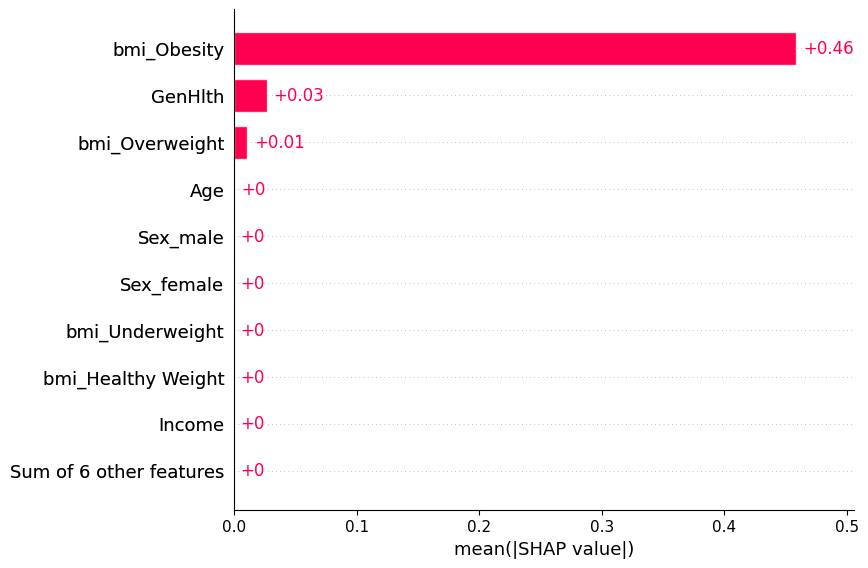

In [ ]:
shap.plots.bar(shap_values)

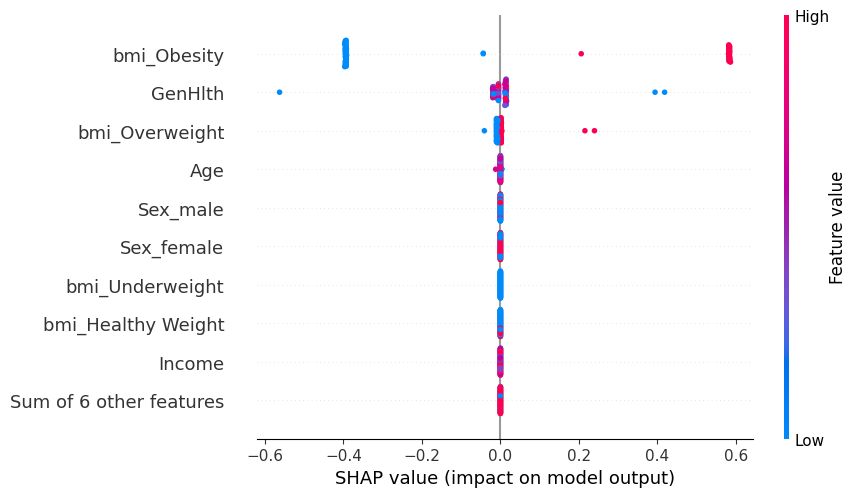

In [ ]:
shap.plots.beeswarm(shap_values)

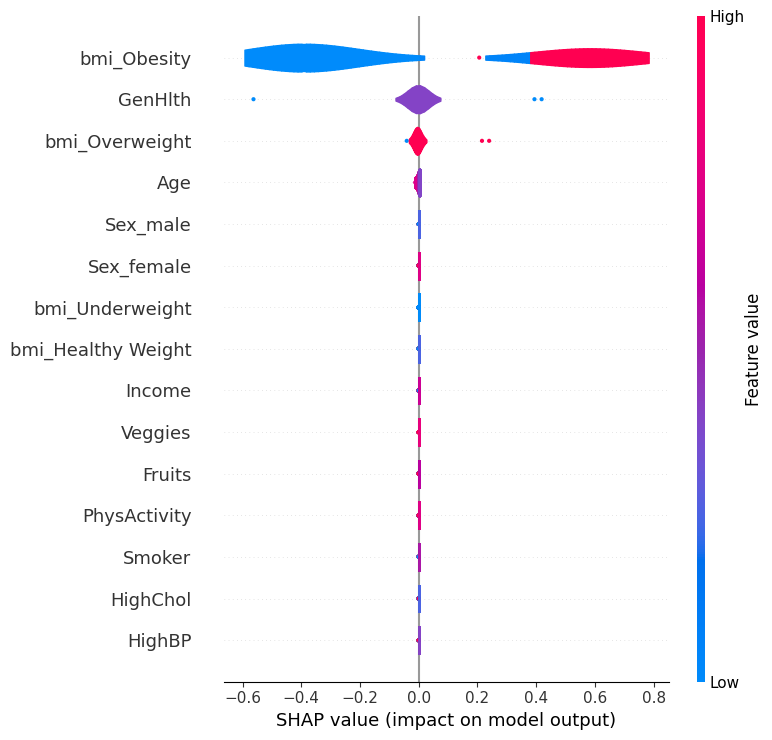

In [ ]:
shap.summary_plot(shap_values, plot_type='violin')

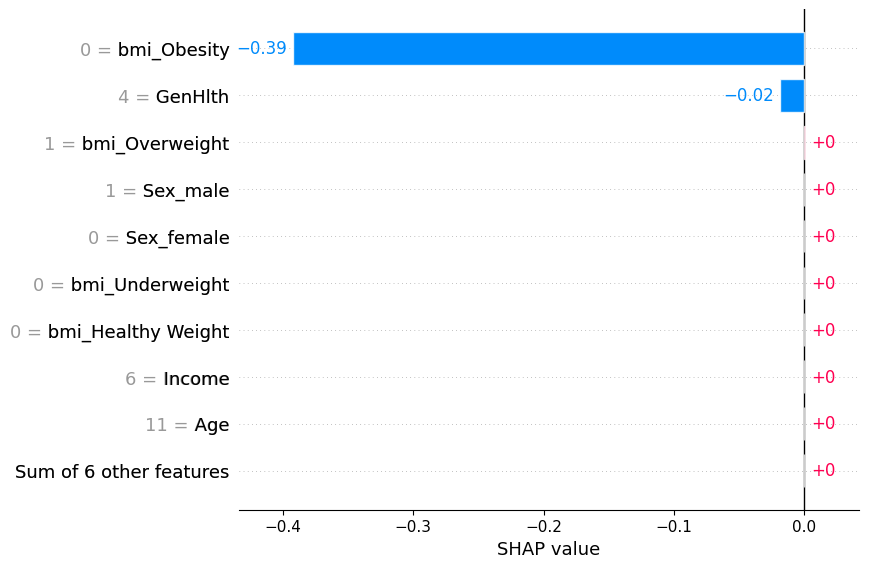

In [ ]:
shap.plots.bar(shap_values[0])

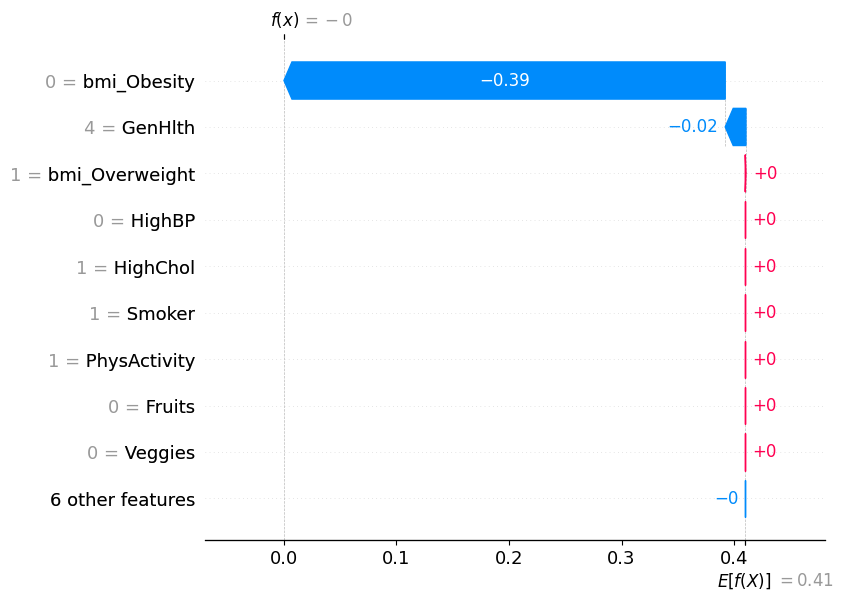

In [ ]:
shap.plots.waterfall(shap_values[0])

**ICE**

In [ ]:
def plot_ice(model, X, feature, num_samples=100):
    # Sample a subset of the data
    X_sample = X.sample(num_samples, random_state=42)

    # Generate a range of values for the feature
    feature_range = np.linspace(X[feature].min(), X[feature].max(), 100)

    # Initialize a figure
    plt.figure(figsize=(10, 6))

    # Iterate over each sample and plot its ICE curve
    for i in range(num_samples):
        X_temp = X_sample.copy()
        y_pred = []

        # Vary the feature of interest and get predictions
        for value in feature_range:
            X_temp[feature] = value
            y_pred.append(model.predict(X_temp)[i])

        # Plot the ICE curve for the sample
        plt.plot(feature_range, y_pred, color='blue', alpha=0.3)

    # Add plot details
    plt.xlabel(feature)
    plt.ylabel('Prediction')
    plt.title(f'ICE Plot for {feature}')
    plt.show()



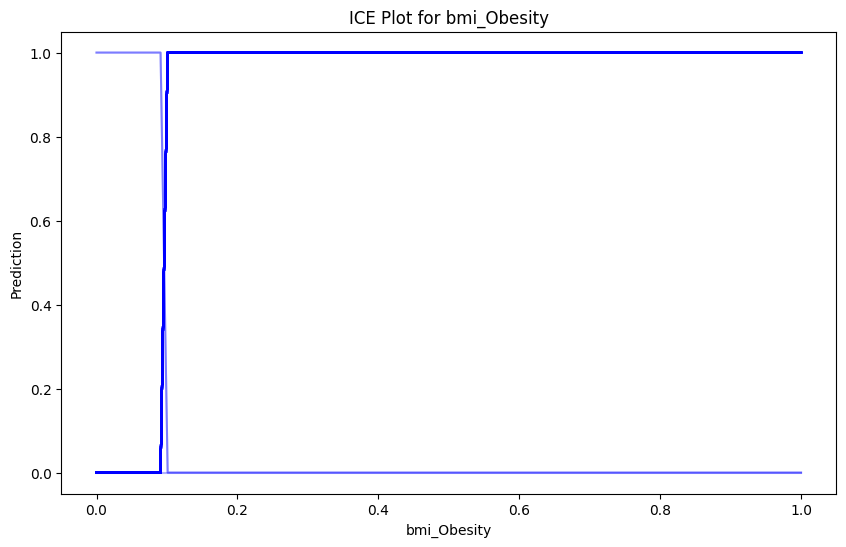

In [ ]:
# Generate ICE plot for a specific feature
plot_ice(best_model_dt, X_test_stratified, 'bmi_Obesity')

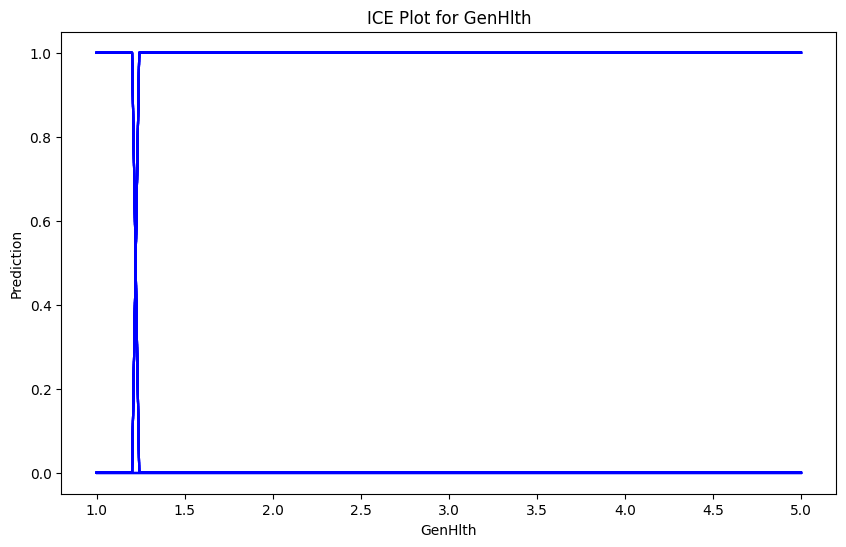

In [ ]:
plot_ice(best_model_dt, X_test_stratified, 'GenHlth')

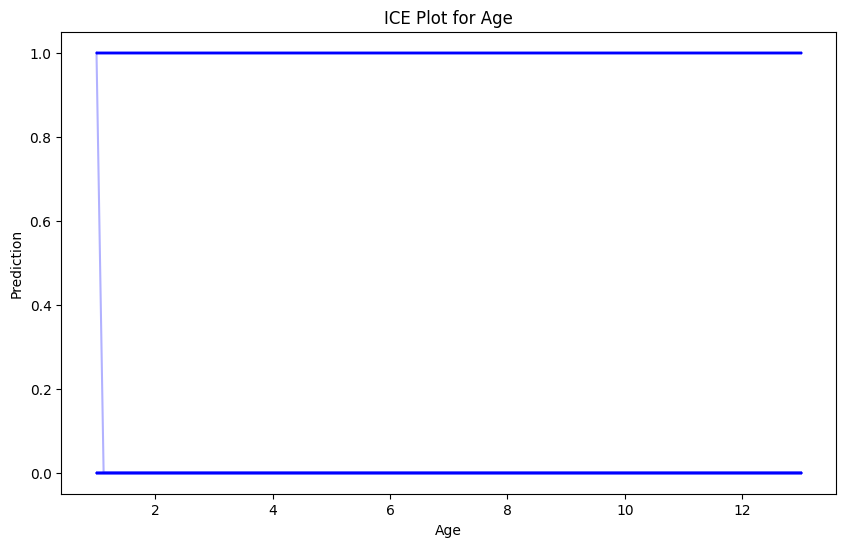

In [ ]:
plot_ice(best_model_dt, X_test_stratified, 'Age')

**LIME**

In [ ]:
pip install lime

In [ ]:
# Create a LIME explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train_stratified,
    feature_names=feature_names,
    class_names=class_names,
    mode='classification'
)

# Select an instance to explain
instance_index = 0
instance = X_test_stratified[instance_index]

# Generate explanation for the instance
explanation = explainer.explain_instance(data_row=instance, predict_fn=best_model_dt.predict_proba)

# Display the explanation
explanation.show_in_notebook(show_all=False)

# If you're running this in a script, you can use the following to show the explanation:
explanation.as_pyplot_figure()
plt.show()

#### SVC

In [ ]:
# Initialize and train the Support Vector Classifier
svc_stratified = SVC(kernel='linear', random_state=42)
svc_stratified.fit(X_train_scaled_stratified, y_train_stratified)

SVC(kernel='linear', random_state=42)

Confusion Matrix:


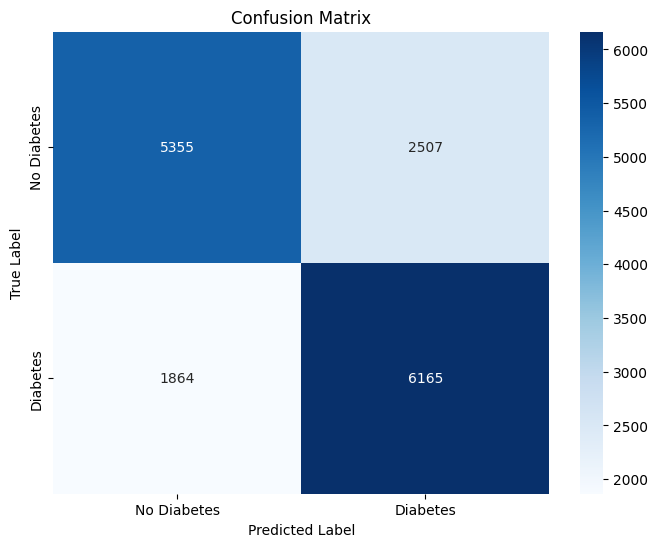


Classification Report:
              precision    recall  f1-score   support

 No Diabetes       0.74      0.68      0.71      7862
    Diabetes       0.71      0.77      0.74      8029

    accuracy                           0.72     15891
   macro avg       0.73      0.72      0.72     15891
weighted avg       0.73      0.72      0.72     15891


Accuracy Score: 0.7249386445157636


In [ ]:
# Predict on the test set
y_pred = svc_stratified.predict(X_test_scaled_stratified)

# Evaluate the model
print("Confusion Matrix:")
conf_matrix = confusion_matrix(y_test_stratified, y_pred)
# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Diabetes',  'Diabetes'],
            yticklabels=['No Diabetes',  'Diabetes'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()
print("\nClassification Report:")
print(classification_report(y_test_stratified, y_pred, target_names=['No Diabetes', 'Diabetes']))
print("\nAccuracy Score:", accuracy_score(y_test_stratified, y_pred))

**Applying Model Hyperparameter Tuning**

In [ ]:
# Define the parameter grid for SVC
params_grid_svc = {
    'gamma': [0.01, 0.001],
    'C': [0.1, 1, 10]
}

# Define the model
model_svc = SVC(kernel='linear', random_state=123)

# Perform grid search
grid_search_svc = GridSearchCV(estimator=model_svc,
                               param_grid=params_grid_svc,
                               scoring='accuracy',
                               cv=5, verbose=1, n_jobs=-1)

grid_search_svc.fit(X_train_scaled_stratified, y_train_stratified.values.ravel())

# Extract the best parameters and model
best_params_svc = grid_search_svc.best_params_
best_model_svc = grid_search_svc.best_estimator_

print("Best parameters found for SVC: ", best_params_svc)


Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best parameters found for SVC:  {'C': 1, 'gamma': 0.01}


In [ ]:
# Predict on the test set
y_pred = best_model_svc.predict(X_test_scaled_stratified)

# Evaluate the model
print("Confusion Matrix:")
conf_matrix = confusion_matrix(y_test_stratified, y_pred)
# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Diabetes',  'Diabetes'],
            yticklabels=['No Diabetes',  'Diabetes'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()
print("\nClassification Report:")
print(classification_report(y_test_stratified, y_pred, target_names=['No Diabetes', 'Diabetes']))
print("\nAccuracy Score:", accuracy_score(y_test_stratified, y_pred))

**PFI**

In [ ]:
# Compute permutation importance
results = permutation_importance(best_model_svc, X_test_stratified.head(100), y_test_stratified.head(100), scoring='accuracy')

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': X_stratified.columns,
    'Importance': results.importances_mean
}).sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.title('Feature Impact (Permutation Importance)')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

**PDP**

**SHapley Additive exPlanations (SHAP)**


In [ ]:
# Fits the explainer
explainer = shap.Explainer(best_model_svc.predict, X_test_stratified_sampled)
# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test_stratified_sampled)


PermutationExplainer explainer: 101it [36:14, 21.74s/it]


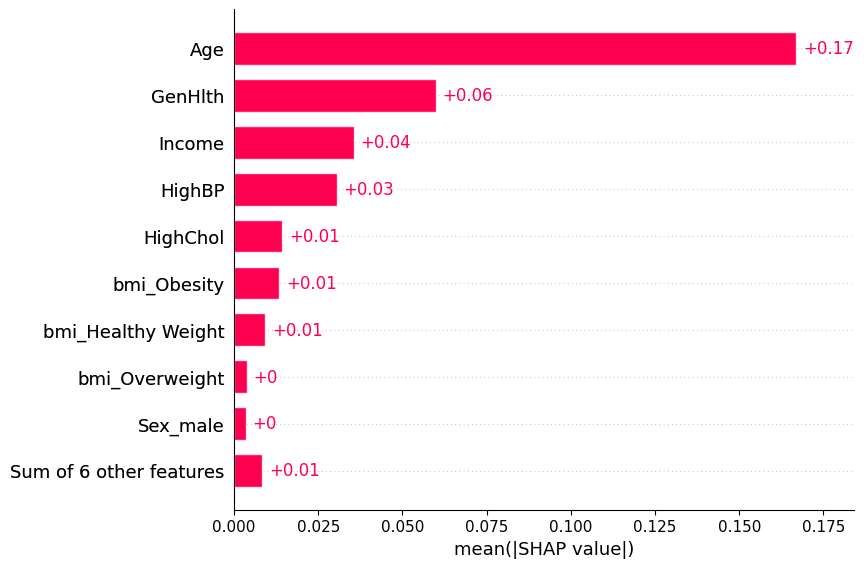

In [ ]:
shap.plots.bar(shap_values)

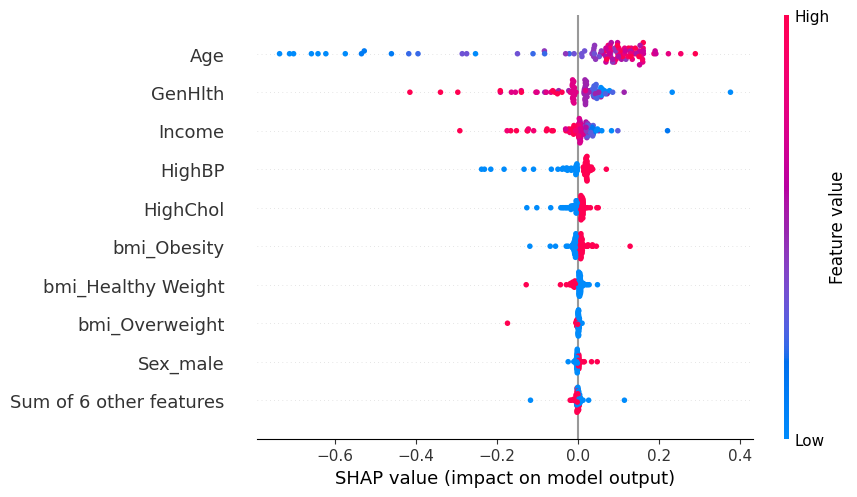

In [ ]:
shap.plots.beeswarm(shap_values)

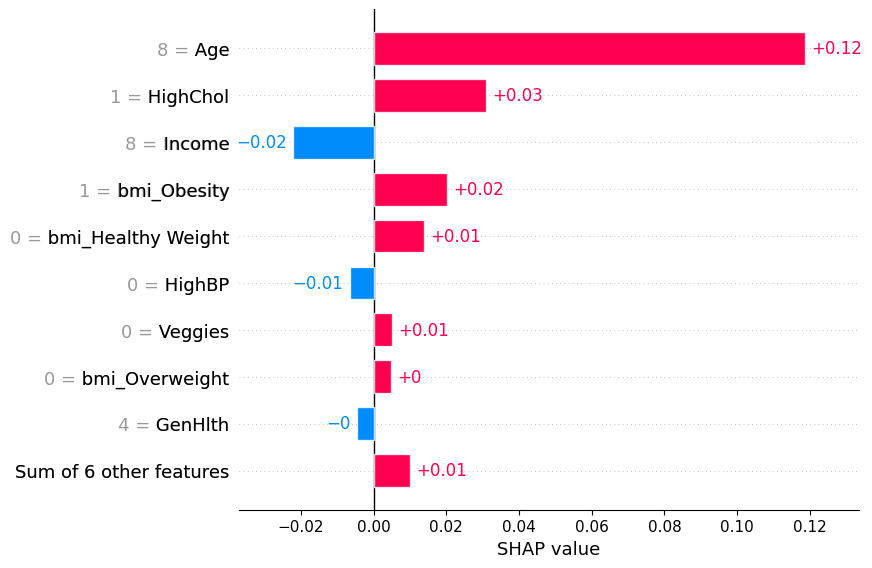

In [ ]:
shap.plots.bar(shap_values[0])

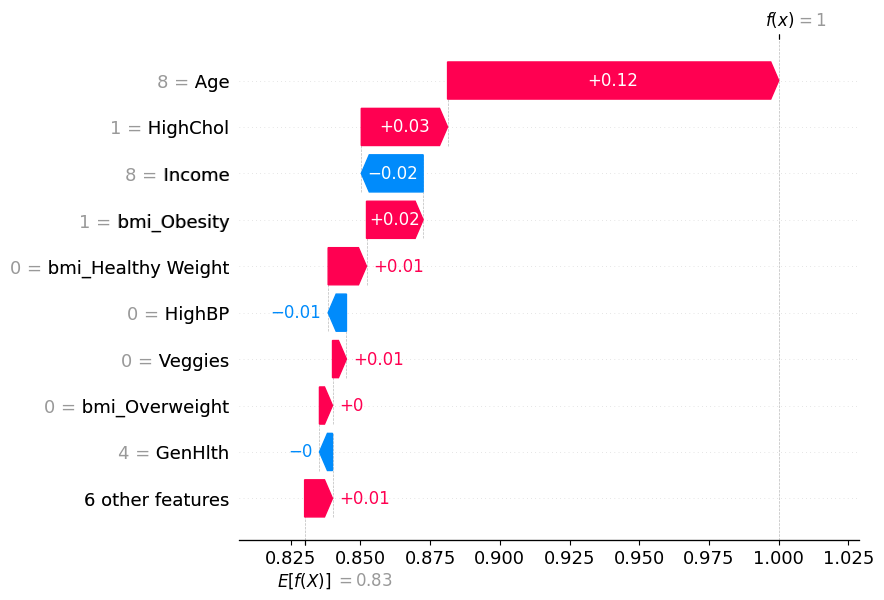

In [ ]:
shap.plots.waterfall(shap_values[0])

#### Random Forest

In [ ]:
rf_stratified = RandomForestClassifier(n_estimators=100, random_state=42)
rf_stratified.fit(X_train_scaled_stratified, y_train_stratified)

RandomForestClassifier(random_state=42)

Confusion Matrix:


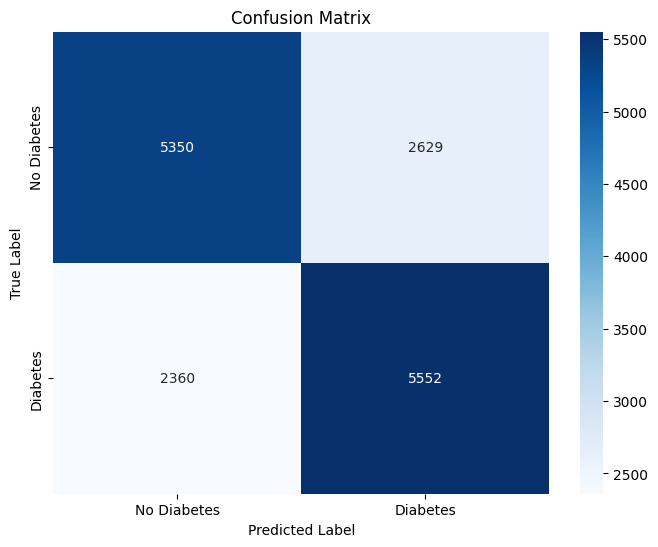


Classification Report:
              precision    recall  f1-score   support

 No Diabetes       0.69      0.67      0.68      7979
    Diabetes       0.68      0.70      0.69      7912

    accuracy                           0.69     15891
   macro avg       0.69      0.69      0.69     15891
weighted avg       0.69      0.69      0.69     15891


Accuracy Score: 0.6860487068151784


In [ ]:
# Predict on the test set
y_pred = rf_stratified.predict(X_test_scaled_stratified)

# Evaluate the model
print("Confusion Matrix:")
conf_matrix = confusion_matrix(y_test_stratified, y_pred)
# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Diabetes','Diabetes'],
            yticklabels=['No Diabetes', 'Diabetes'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()
print("\nClassification Report:")
print(classification_report(y_test_stratified, y_pred, target_names=['No Diabetes', 'Diabetes']))
print("\nAccuracy Score:", accuracy_score(y_test_stratified, y_pred))

**Fine Tuned Model**

In [ ]:
params_grid_rf = {
    'n_estimators': [50, 100, 200],           # Number of trees in the forest
    'max_depth': [10, 20, 30],          # Maximum depth of the tree
    'min_samples_leaf': [1, 2, 4],            # Minimum number of samples required to be at a leaf node
}

model_rf = RandomForestClassifier(random_state=123)
grid_search_rf = GridSearchCV(
    estimator=model_rf,
    param_grid=params_grid_rf,
    scoring='accuracy',           # Metric to evaluate the model
    cv=5,                        # Number of cross-validation folds
    verbose=1,                   # Verbosity level
    n_jobs=-1                    # Use all available cores
)
grid_search_rf.fit(X_train_scaled_stratified, y_train_stratified)
best_params_rf = grid_search_rf.best_params_
print("Best Parameters:", best_params_rf)

# Optionally, print the best score
best_score_rf = grid_search_rf.best_score_
print("Best Score:", best_score_rf)


Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best Parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'n_estimators': 200}
Best Score: 0.7263416938613354


Confusion Matrix:


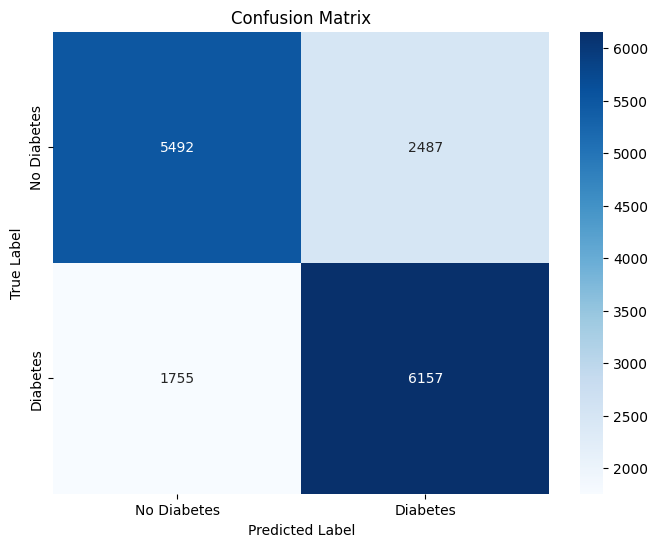


Classification Report:
              precision    recall  f1-score   support

 No Diabetes       0.76      0.69      0.72      7979
    Diabetes       0.71      0.78      0.74      7912

    accuracy                           0.73     15891
   macro avg       0.74      0.73      0.73     15891
weighted avg       0.74      0.73      0.73     15891


Accuracy Score: 73.30564470454975


In [ ]:
best_model_rf = grid_search_rf.best_estimator_
# Predict on the test set
y_pred = best_model_rf.predict(X_test_scaled_stratified)


# Evaluate the model
print("Confusion Matrix:")
conf_matrix = confusion_matrix(y_test_stratified, y_pred)
# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Diabetes', 'Diabetes'],
            yticklabels=['No Diabetes', 'Diabetes'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()
print("\nClassification Report:")
print(classification_report(y_test_stratified, y_pred, target_names=['No Diabetes',  'Diabetes']))
print("\nAccuracy Score:", accuracy_score(y_test_stratified, y_pred) * 100)

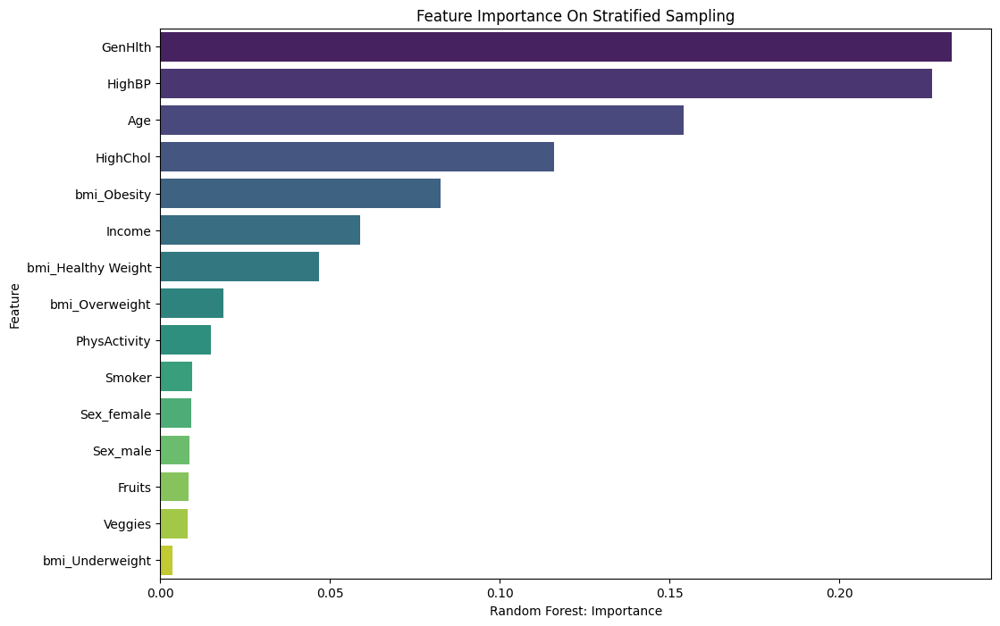

In [ ]:
# Feature importance
importances = best_model_rf.feature_importances_
feature_names = X_stratified.columns

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.title('Feature Importance On Stratified Sampling')
plt.xlabel('Random Forest: Importance')
plt.ylabel('Feature')
plt.show()

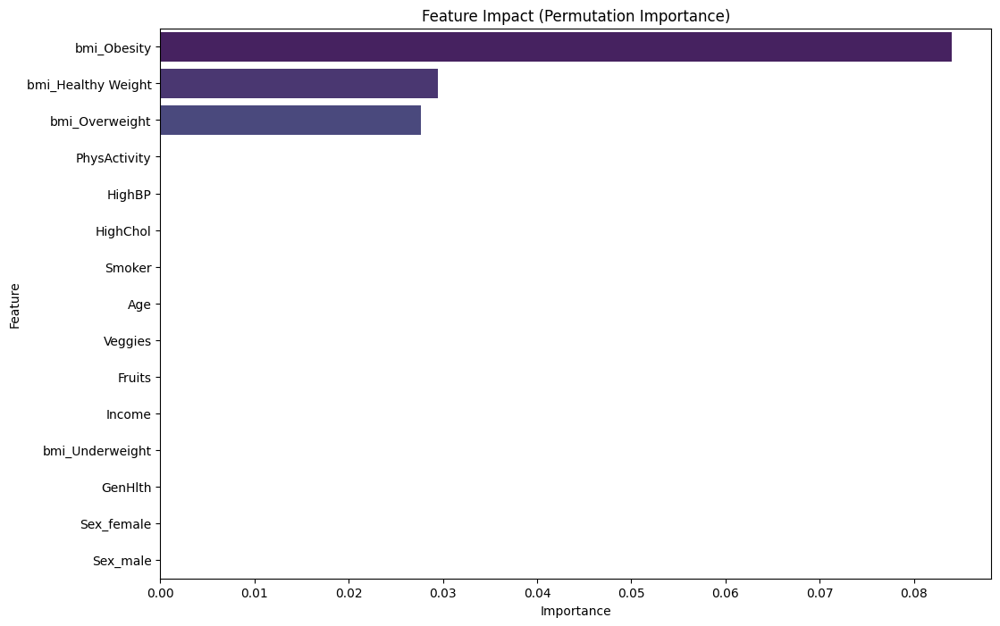

In [ ]:
# Compute permutation importance
results = permutation_importance(best_model_rf, X_test_stratified.head(100), y_test_stratified.head(100), scoring='recall_macro')

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': X_stratified.columns,
    'Importance': results.importances_mean
}).sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.title('Feature Impact (Permutation Importance)')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

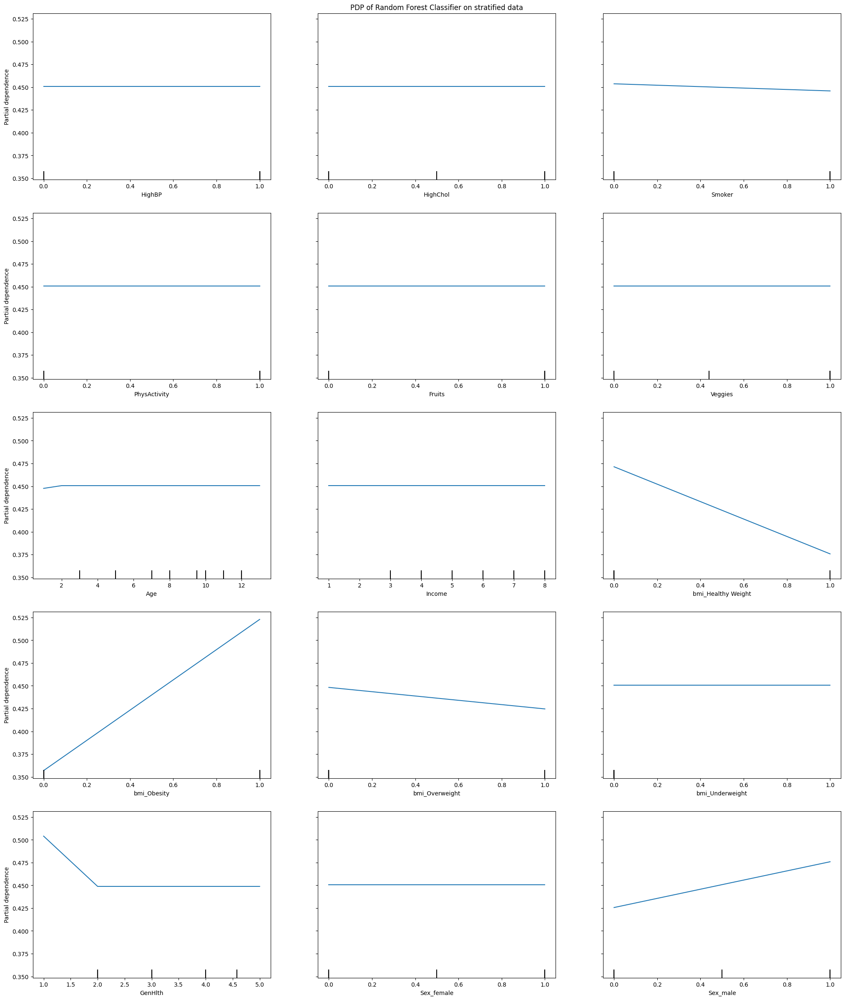

In [ ]:
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay

fig, ax = plt.subplots(figsize=(25, 30))
plt.title('PDP of Random Forest Classifier on stratified data')
PartialDependenceDisplay.from_estimator(
    estimator=best_model_rf,
    X=X_test_stratified_sampled,
    features=X_stratified.columns, # the features to plot
    #categorical_features = (2, 3), # categorical features
    random_state=42,
    ax=ax,
)
plt.show()


In [ ]:

# Fits the explainer
explainer = shap.Explainer(best_model_rf.predict, X_test_stratified_sampled)
# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test_stratified_sampled)


PermutationExplainer explainer: 101it [00:58,  1.51it/s]


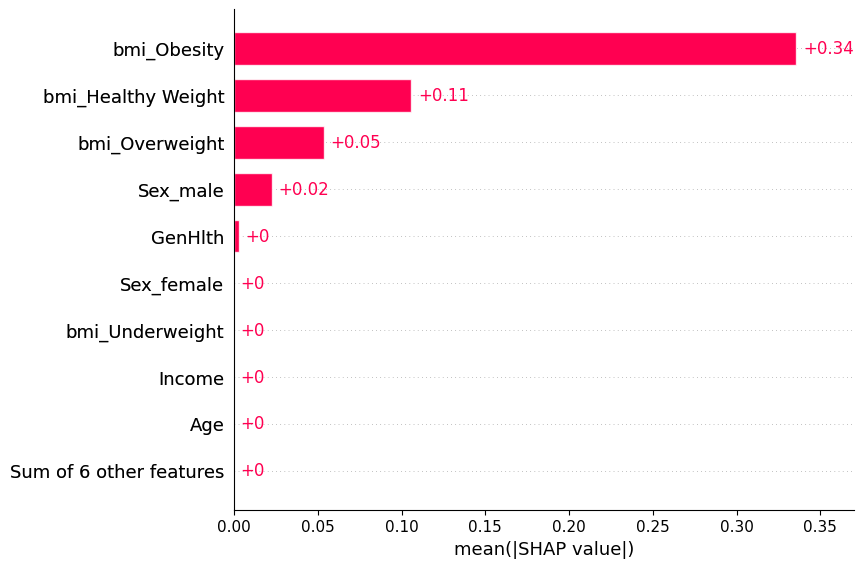

In [ ]:
shap.plots.bar(shap_values)

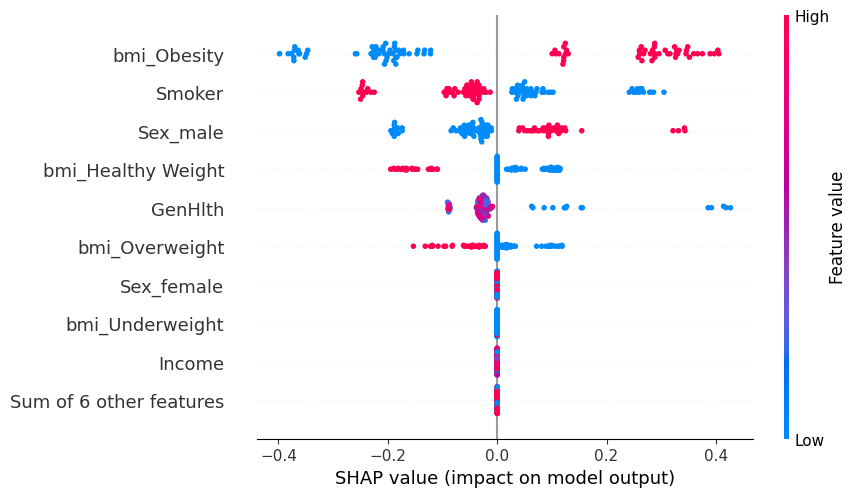

In [ ]:
shap.plots.beeswarm(shap_values)

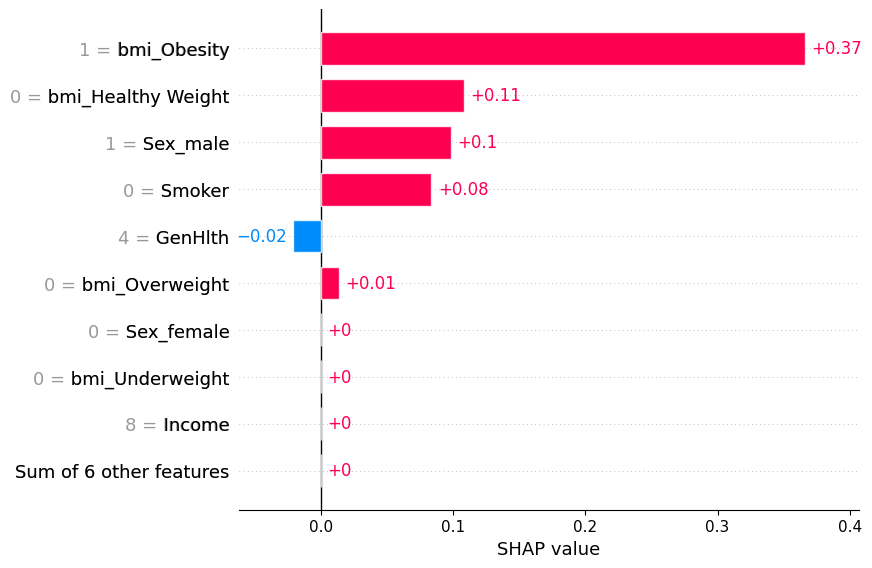

In [ ]:
shap.plots.bar(shap_values[0])

**ICE**

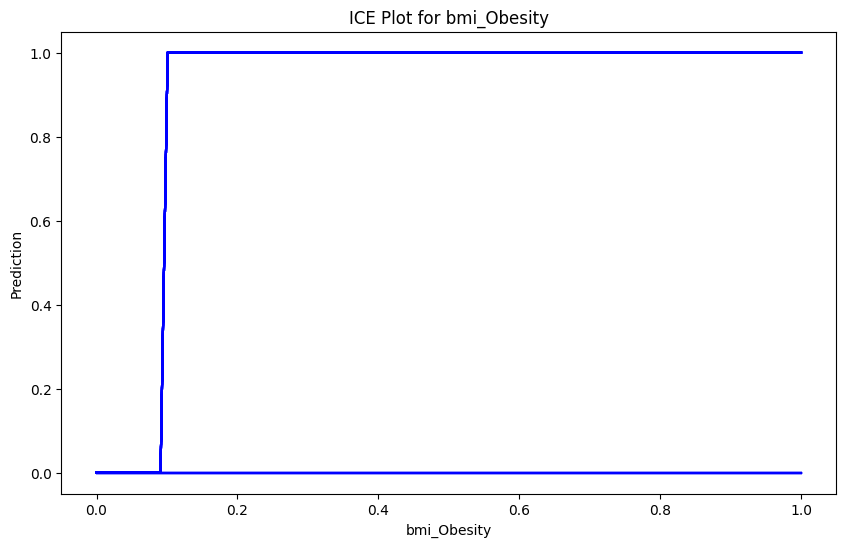

In [ ]:
# Generate ICE plot for a specific feature
plot_ice(best_model_rf, X_test_stratified, 'bmi_Obesity')

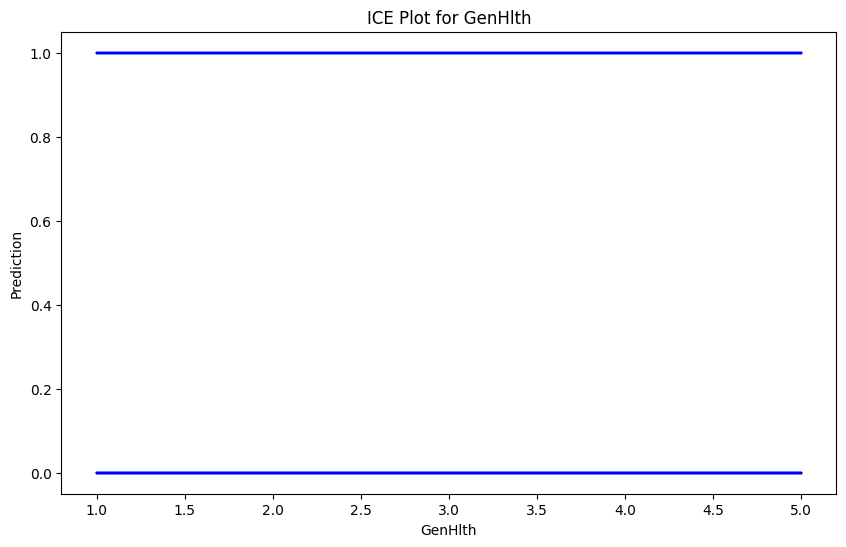

In [ ]:
plot_ice(best_model_rf, X_test_stratified, 'GenHlth')

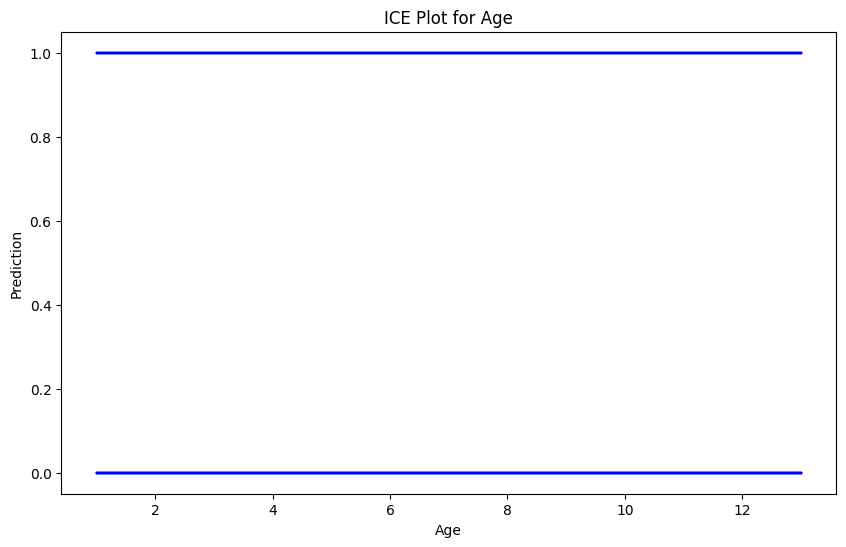

In [ ]:
plot_ice(best_model_rf, X_test_stratified, 'Age')

# LazyPredict

In [ ]:
from sklearn.utils import all_estimators
from sklearn.base import ClassifierMixin, RegressorMixin

# Get all the classifiers
classifiers = [est for est in all_estimators() if issubclass(est[1], ClassifierMixin)]

# Get all the regressors
regressors = [est for est in all_estimators() if issubclass(est[1], RegressorMixin)]

# Print all classifiers
print("Classifiers:")
for name, class_ in classifiers:
    print(name, class_)

# Print all regressors
print("\nRegressors:")
for name, class_ in regressors:
    print(name, class_)


In [ ]:
import lazypredict
from lazypredict.Supervised import LazyClassifier

# For classification
clf = LazyClassifier(verbose=1, ignore_warnings=True, custom_metric=None)

# Fit the model and evaluate
models, predictions = clf.fit(X_train_stratified, X_test_stratified, y_train_stratified, y_test_stratified)

# Print the results
print(models)

  3%|▎         | 1/29 [00:01<00:29,  1.05s/it]

{'Model': 'AdaBoostClassifier', 'Accuracy': 0.7093952551758858, 'Balanced Accuracy': 0.7094632732922643, 'ROC AUC': 0.7094632732922644, 'F1 Score': 0.7089372962945436, 'Time taken': 1.0452995300292969}


  7%|▋         | 2/29 [00:01<00:23,  1.16it/s]

{'Model': 'BaggingClassifier', 'Accuracy': 0.6712604618966711, 'Balanced Accuracy': 0.6712990735993981, 'ROC AUC': 0.6712990735993982, 'F1 Score': 0.6710951714660421, 'Time taken': 0.7310035228729248}
{'Model': 'BernoulliNB', 'Accuracy': 0.7032911711031401, 'Balanced Accuracy': 0.7033447372777922, 'ROC AUC': 0.7033447372777921, 'F1 Score': 0.7030026400419763, 'Time taken': 0.0673072338104248}


 21%|██        | 6/29 [00:02<00:07,  3.06it/s]

{'Model': 'CalibratedClassifierCV', 'Accuracy': 0.7078220376313636, 'Balanced Accuracy': 0.7078728369428875, 'ROC AUC': 0.7078728369428876, 'F1 Score': 0.7075669938533902, 'Time taken': 0.6064834594726562}
{'Model': 'DecisionTreeClassifier', 'Accuracy': 0.6666037379648858, 'Balanced Accuracy': 0.6665713407537381, 'ROC AUC': 0.6665713407537381, 'F1 Score': 0.666479089228144, 'Time taken': 0.16129827499389648}


 28%|██▊       | 8/29 [00:02<00:04,  4.50it/s]

{'Model': 'DummyClassifier', 'Accuracy': 0.49915046252595807, 'Balanced Accuracy': 0.5, 'ROC AUC': 0.5, 'F1 Score': 0.33238983073130157, 'Time taken': 0.04486680030822754}
{'Model': 'ExtraTreeClassifier', 'Accuracy': 0.6658485935435152, 'Balanced Accuracy': 0.6658176910448195, 'ROC AUC': 0.6658176910448195, 'F1 Score': 0.6657348047831727, 'Time taken': 0.08990192413330078}


 31%|███       | 9/29 [00:07<00:22,  1.14s/it]

{'Model': 'ExtraTreesClassifier', 'Accuracy': 0.6696243156503682, 'Balanced Accuracy': 0.6696058268748364, 'ROC AUC': 0.6696058268748364, 'F1 Score': 0.6695833287023598, 'Time taken': 4.308978080749512}
{'Model': 'GaussianNB', 'Accuracy': 0.7062488200868416, 'Balanced Accuracy': 0.7062954449420147, 'ROC AUC': 0.7062954449420146, 'F1 Score': 0.7060332962303615, 'Time taken': 0.05390357971191406}


 38%|███▊      | 11/29 [00:08<00:18,  1.02s/it]

{'Model': 'KNeighborsClassifier', 'Accuracy': 0.6770499024605122, 'Balanced Accuracy': 0.6770998644908408, 'ROC AUC': 0.6770998644908408, 'F1 Score': 0.6767763547316057, 'Time taken': 1.6363961696624756}


 41%|████▏     | 12/29 [01:38<05:44, 20.27s/it]

{'Model': 'LabelPropagation', 'Accuracy': 0.6802592662513373, 'Balanced Accuracy': 0.680312765936012, 'ROC AUC': 0.680312765936012, 'F1 Score': 0.6799483380812896, 'Time taken': 89.40263938903809}


 48%|████▊     | 14/29 [03:45<08:31, 34.09s/it]

{'Model': 'LabelSpreading', 'Accuracy': 0.6812661254798313, 'Balanced Accuracy': 0.6813204834382869, 'ROC AUC': 0.6813204834382869, 'F1 Score': 0.6809460698182579, 'Time taken': 127.07484078407288}
{'Model': 'LinearDiscriminantAnalysis', 'Accuracy': 0.7086401107545152, 'Balanced Accuracy': 0.7086967930766206, 'ROC AUC': 0.7086967930766205, 'F1 Score': 0.708322584386249, 'Time taken': 0.10613512992858887}


 59%|█████▊    | 17/29 [03:49<02:58, 14.88s/it]

{'Model': 'LinearSVC', 'Accuracy': 0.708703039456296, 'Balanced Accuracy': 0.7087591873556212, 'ROC AUC': 0.7087591873556213, 'F1 Score': 0.7083916156691514, 'Time taken': 4.064598321914673}
{'Model': 'LogisticRegression', 'Accuracy': 0.7083254672456107, 'Balanced Accuracy': 0.7083739157509011, 'ROC AUC': 0.708373915750901, 'F1 Score': 0.7080942017887698, 'Time taken': 0.07750058174133301}
{'Model': 'NearestCentroid', 'Accuracy': 0.7069410358064313, 'Balanced Accuracy': 0.7069892664732776, 'ROC AUC': 0.7069892664732775, 'F1 Score': 0.7067107484656602, 'Time taken': 0.05361509323120117}


 62%|██████▏   | 18/29 [48:13<1:57:08, 638.95s/it]

{'Model': 'NuSVC', 'Accuracy': 0.5330690327858536, 'Balanced Accuracy': 0.5330897105228594, 'ROC AUC': 0.5330897105228594, 'F1 Score': 0.5330008420178469, 'Time taken': 2664.028097629547}
{'Model': 'PassiveAggressiveClassifier', 'Accuracy': 0.6245044364734755, 'Balanced Accuracy': 0.6249634330558332, 'ROC AUC': 0.6249634330558332, 'F1 Score': 0.5950091009814059, 'Time taken': 0.0950624942779541}


 69%|██████▉   | 20/29 [48:13<57:17, 381.95s/it]  

{'Model': 'Perceptron', 'Accuracy': 0.6116669813101756, 'Balanced Accuracy': 0.611323178795107, 'ROC AUC': 0.6113231787951071, 'F1 Score': 0.5950501473685529, 'Time taken': 0.14690041542053223}
{'Model': 'QuadraticDiscriminantAnalysis', 'Accuracy': 0.7078849663331446, 'Balanced Accuracy': 0.7079779995776387, 'ROC AUC': 0.7079779995776387, 'F1 Score': 0.707018158533289, 'Time taken': 0.09602665901184082}


 83%|████████▎ | 24/29 [48:17<13:19, 159.93s/it]

{'Model': 'RandomForestClassifier', 'Accuracy': 0.6779938329872255, 'Balanced Accuracy': 0.6780368478847436, 'ROC AUC': 0.6780368478847436, 'F1 Score': 0.6777924659169746, 'Time taken': 3.852633476257324}
{'Model': 'RidgeClassifier', 'Accuracy': 0.7086401107545152, 'Balanced Accuracy': 0.7086967930766206, 'ROC AUC': 0.7086967930766205, 'F1 Score': 0.708322584386249, 'Time taken': 0.06620264053344727}
{'Model': 'RidgeClassifierCV', 'Accuracy': 0.7086401107545152, 'Balanced Accuracy': 0.7086967930766206, 'ROC AUC': 0.7086967930766205, 'F1 Score': 0.708322584386249, 'Time taken': 0.10720634460449219}


 86%|████████▌ | 25/29 [48:18<08:34, 128.53s/it]

{'Model': 'SGDClassifier', 'Accuracy': 0.7058712478761563, 'Balanced Accuracy': 0.7059989176754771, 'ROC AUC': 0.7059989176754772, 'F1 Score': 0.7042171610825132, 'Time taken': 0.2476646900177002}


 90%|████████▉ | 26/29 [51:34<07:10, 143.43s/it]

{'Model': 'SVC', 'Accuracy': 0.7078849663331446, 'Balanced Accuracy': 0.7079908300843639, 'ROC AUC': 0.7079908300843639, 'F1 Score': 0.7067597765720437, 'Time taken': 196.45972204208374}


 97%|█████████▋| 28/29 [51:35<01:28, 88.25s/it] 

{'Model': 'XGBClassifier', 'Accuracy': 0.707129821911774, 'Balanced Accuracy': 0.7072222114509326, 'ROC AUC': 0.7072222114509327, 'F1 Score': 0.7062728321757467, 'Time taken': 0.36413121223449707}
[LightGBM] [Info] Number of positive: 31794, number of negative: 31767
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 47
[LightGBM] [Info] Number of data points in the train set: 63561, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500212 -> initscore=0.000850
[LightGBM] [Info] Start training from score 0.000850


100%|██████████| 29/29 [51:35<00:00, 106.75s/it]

{'Model': 'LGBMClassifier', 'Accuracy': 0.7094581838776666, 'Balanced Accuracy': 0.7095566746291841, 'ROC AUC': 0.7095566746291839, 'F1 Score': 0.7084909534488739, 'Time taken': 0.6271336078643799}
                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
LGBMClassifier                     0.71               0.71     0.71      0.71   
AdaBoostClassifier                 0.71               0.71     0.71      0.71   
LinearSVC                          0.71               0.71     0.71      0.71   
LinearDiscriminantAnalysis         0.71               0.71     0.71      0.71   
RidgeClassifierCV                  0.71               0.71     0.71      0.71   
RidgeClassifier                    0.71               0.71     0.71      0.71   
LogisticRegression                 0.71               0.71     0.71      0.71   
SVC                                0.71               0.71     0.71      

In [29]:
!pip install lightgbm


# **New Approach - SMOTE-ENN**

Developed by Batista et al (2004), this method combines the SMOTE ability to generate synthetic examples for minority class and ENN ability to delete some observations from both classes that are identified as having different class between the observation’s class and its K-nearest neighbor majority class.

**Reference:**

Batista, G. E. A. P. A., Prati, R. C., and Monard, M. C. (2004). A Study of the Behavior of Several Methods for Balancing Machine Learning Training Data. ACM SIGKDD Explorations Newsletter, vol. 6, no.1, pp. 20–29.

In [30]:
df.head()

,Diabetes_012,HighBP,HighChol,Smoker,PhysActivity,Fruits,Veggies,Sex,Age,Income,bmi_Healthy Weight,bmi_Obesity,bmi_Overweight,bmi_Underweight,GenHlth
0,0.00,1.00,1.00,1.00,0.00,0.00,1.00,0.00,9.00,3.00,False,True,False,False,1
1,0.00,0.00,0.00,1.00,1.00,0.00,0.00,0.00,7.00,1.00,False,False,True,False,3
2,0.00,1.00,1.00,0.00,0.00,1.00,0.00,0.00,9.00,8.00,False,False,True,False,1
3,0.00,1.00,0.00,0.00,1.00,1.00,1.00,0.00,11.00,6.00,False,False,True,False,4
4,0.00,1.00,1.00,0.00,1.00,1.00,1.00,0.00,11.00,4.00,True,False,False,False,4


In [31]:
X = df.drop(['Diabetes_012'], axis = 1).values
y = df['Diabetes_012']

In [32]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [33]:
# SMOTEENN
smoteenn = SMOTEENN(random_state=42)
X_resampled_smoteenn, y_resampled_smoteenn = smoteenn.fit_resample(X_train, y_train)

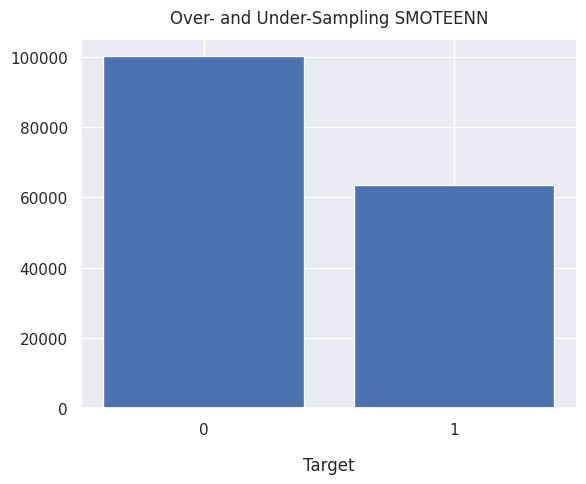

,count
Diabetes_012,
0.00,100149
1.00,63422


In [34]:
# Over- and Under-Sampling SMOTEENN
sns.set(font_scale=1.0)
smoteenn_counts = y_resampled_smoteenn.value_counts()

plt.bar(smoteenn_counts.index, smoteenn_counts.values)
plt.xlabel("Target", labelpad=14)
plt.xticks([0, 1])
plt.title("Over- and Under-Sampling SMOTEENN", y=1.02);
plt.show()

smoteenn_counts

In [35]:
X_train_smoteenn, X_test, y_train_smoteenn, y_test = train_test_split(X_resampled_smoteenn, y_resampled_smoteenn, test_size=0.2, random_state=42)

In [36]:
from sklearn.neighbors import KNeighborsClassifier

# Initialize and train the K-Nearest Neighbors (KNN) Classifier
knn_smoteenn = KNeighborsClassifier()
knn_smoteenn.fit(X_train_smoteenn, y_train_smoteenn)


KNeighborsClassifier()

In [37]:
dt_classifier_smoteenn = DecisionTreeClassifier(random_state=42)
dt_classifier_smoteenn.fit(X_train_smoteenn, y_train_smoteenn)

DecisionTreeClassifier(random_state=42)

In [38]:
from sklearn.model_selection import train_test_split, GridSearchCV
params_grid_dt = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [5, 10, 15, 20],
    'min_samples_leaf': [1, 2, 5]
}
# Define the model
model_dt = DecisionTreeClassifier(random_state=123)

grid_search_dt = GridSearchCV(estimator = model_dt,
                        param_grid = params_grid_dt,
                        scoring='accuracy',
                        cv = 5, verbose = 1, n_jobs = -1)
grid_search_dt.fit(X_train_smoteenn, y_train_smoteenn)
best_params_dt = grid_search_dt.best_params_
print(best_params_dt)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
{'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 1}


In [39]:
# Over and Under-Sampling SMTOEENN
xgboost_smoteenn = xgboost.XGBClassifier()
xgboost_smoteenn.fit(X_train_smoteenn, y_train_smoteenn)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [40]:

# Initialize and train the LightGBM (Light Gradient Boosting Machine) Classifier
lgbm_smoteenn = lgb.LGBMClassifier()
lgbm_smoteenn.fit(X_train_smoteenn, y_train_smoteenn)

[LightGBM] [Info] Number of positive: 50575, number of negative: 80281
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005544 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3398
[LightGBM] [Info] Number of data points in the train set: 130856, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.386494 -> initscore=-0.462076
[LightGBM] [Info] Start training from score -0.462076


LGBMClassifier()

In [41]:
rf_smoteenn = RandomForestClassifier(n_estimators=100, random_state=42)
rf_smoteenn.fit(X_train_smoteenn, y_train_smoteenn)

RandomForestClassifier(random_state=42)

##**Model Evalution**

Confusion Matrix:


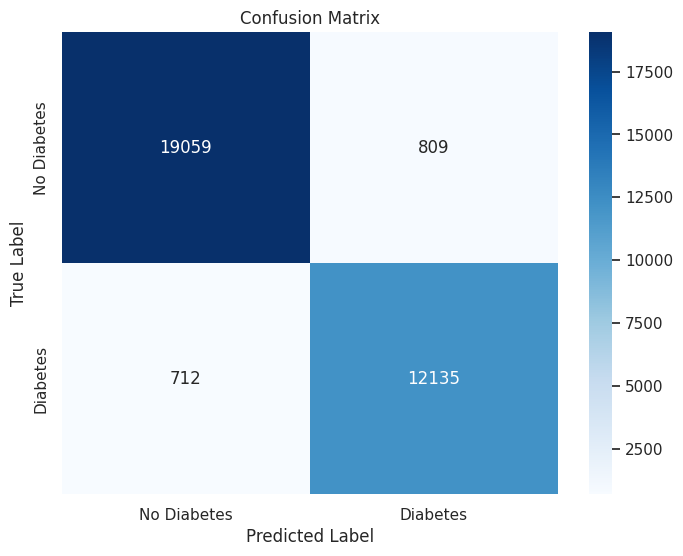


Test Set:
              precision    recall  f1-score   support

         0.0       0.96      0.96      0.96     19868
         1.0       0.94      0.94      0.94     12847

    accuracy                           0.95     32715
   macro avg       0.95      0.95      0.95     32715
weighted avg       0.95      0.95      0.95     32715


Test Set Accuracy: 95.35075653370015


In [42]:
# Make predictions
y_test_pred_smoteenn = knn_smoteenn.predict(X_test)

# Evaluate the model
print("Confusion Matrix:")
conf_matrix = confusion_matrix(y_test, y_test_pred_smoteenn)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Diabetes',  'Diabetes'],
            yticklabels=['No Diabetes',  'Diabetes'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

y_test_pred_smoteenn = knn_smoteenn.predict(X_test)

print("\nTest Set:")
print(classification_report(y_test, y_test_pred_smoteenn))

accuracy_knn_smoteenn = accuracy_score(y_test, y_test_pred_smoteenn)

print("\nTest Set Accuracy:", accuracy_knn_smoteenn * 100)

Confusion Matrix:


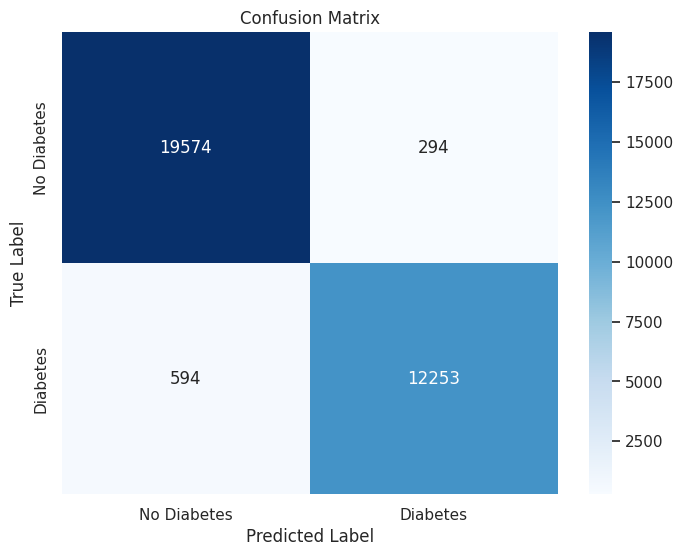


Test Set:
              precision    recall  f1-score   support

         0.0       0.97      0.99      0.98     19868
         1.0       0.98      0.95      0.97     12847

    accuracy                           0.97     32715
   macro avg       0.97      0.97      0.97     32715
weighted avg       0.97      0.97      0.97     32715


Test Set Accuracy: 97.28564878496103


In [43]:
# Make predictions
y_test_pred_smoteenn = rf_smoteenn.predict(X_test)

# Evaluate the model
print("Confusion Matrix:")
conf_matrix = confusion_matrix(y_test, y_test_pred_smoteenn)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Diabetes',  'Diabetes'],
            yticklabels=['No Diabetes',  'Diabetes'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

y_test_pred_smoteenn = rf_smoteenn.predict(X_test)

print("\nTest Set:")
print(classification_report(y_test, y_test_pred_smoteenn))

accuracy_rf_smoteenn = accuracy_score(y_test, y_test_pred_smoteenn)

print("\nTest Set Accuracy:", accuracy_rf_smoteenn * 100)

Confusion Matrix:


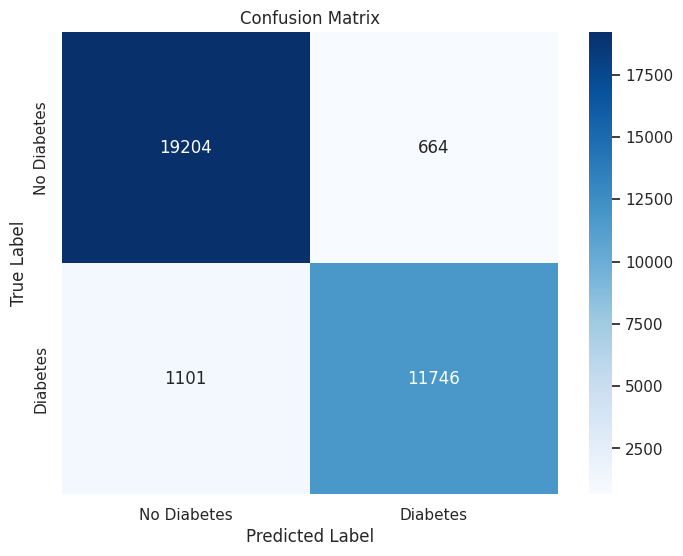


Test Set:
              precision    recall  f1-score   support

         0.0       0.95      0.97      0.96     19868
         1.0       0.95      0.91      0.93     12847

    accuracy                           0.95     32715
   macro avg       0.95      0.94      0.94     32715
weighted avg       0.95      0.95      0.95     32715


Test Set Accuracy: 94.60492128992817


In [44]:
# Make predictions
y_test_pred_smoteenn = xgboost_smoteenn.predict(X_test)

# Evaluate the model
print("Confusion Matrix:")
conf_matrix = confusion_matrix(y_test, y_test_pred_smoteenn)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Diabetes',  'Diabetes'],
            yticklabels=['No Diabetes',  'Diabetes'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

y_test_pred_smoteenn = xgboost_smoteenn.predict(X_test)

print("\nTest Set:")
print(classification_report(y_test, y_test_pred_smoteenn))

accuracy_xgb_smoteenn = accuracy_score(y_test, y_test_pred_smoteenn)

print("\nTest Set Accuracy:", accuracy_xgb_smoteenn * 100)

Confusion Matrix:


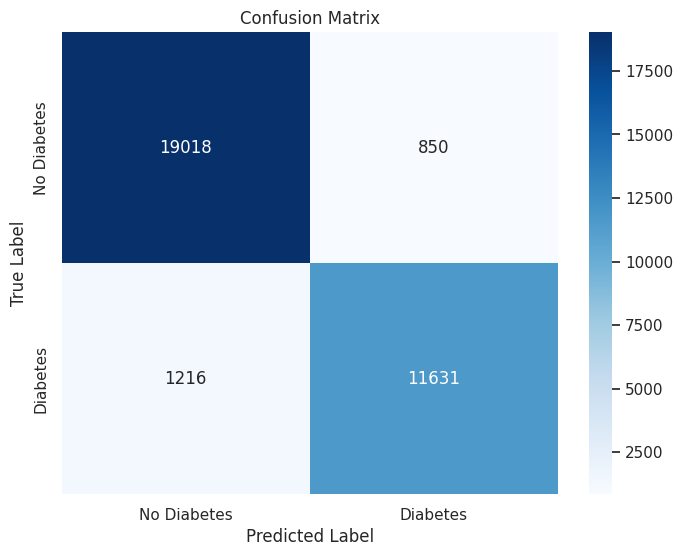


Test Set:
              precision    recall  f1-score   support

         0.0       0.94      0.96      0.95     19868
         1.0       0.93      0.91      0.92     12847

    accuracy                           0.94     32715
   macro avg       0.94      0.93      0.93     32715
weighted avg       0.94      0.94      0.94     32715


Test Set Accuracy: 93.68485404248815


In [45]:
# Make predictions
y_test_pred_smoteenn = lgbm_smoteenn.predict(X_test)

# Evaluate the model
print("Confusion Matrix:")
conf_matrix = confusion_matrix(y_test, y_test_pred_smoteenn)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Diabetes',  'Diabetes'],
            yticklabels=['No Diabetes',  'Diabetes'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

y_test_pred_smoteenn = lgbm_smoteenn.predict(X_test)

print("\nTest Set:")
print(classification_report(y_test, y_test_pred_smoteenn))

accuracy_lgbm_smoteenn = accuracy_score(y_test, y_test_pred_smoteenn)

print("\nTest Set Accuracy:", accuracy_lgbm_smoteenn * 100)

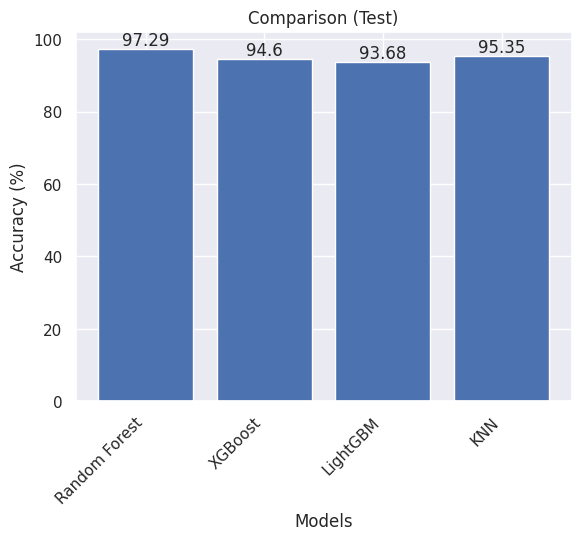

In [46]:
model_comp = pd.DataFrame({'Models': ['Random Forest','XGBoost','LightGBM', 'KNN'],
                           'Accuracy': [accuracy_rf_smoteenn *100, accuracy_xgb_smoteenn*100, accuracy_lgbm_smoteenn*100, accuracy_knn_smoteenn * 100]})

fig, ax = plt.subplots()
bars = plt.bar(model_comp['Models'], model_comp['Accuracy'])
plt.xlabel('Models')
plt.ylabel('Accuracy (%)')
plt.title('Comparison (Test)')
plt.xticks(rotation=45, ha='right')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

plt.show()

In [47]:
df.columns[1:]


Index(['HighBP', 'HighChol', 'Smoker', 'PhysActivity', 'Fruits', 'Veggies',
       'Sex', 'Age', 'Income', 'bmi_Healthy Weight', 'bmi_Obesity',
       'bmi_Overweight', 'bmi_Underweight', 'GenHlth'],
      dtype='object')

##**Feature Importance for White Box Model - Decision Tree**

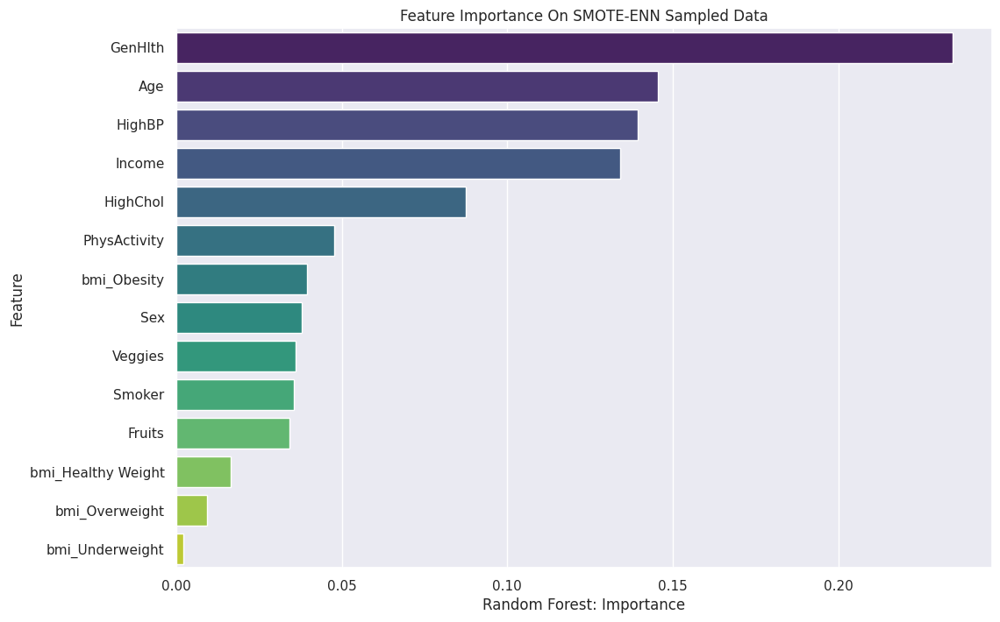

In [48]:
# Feature importance
importances = rf_smoteenn.feature_importances_
feature_names = df.columns[1:]

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.title('Feature Importance On SMOTE-ENN Sampled Data')
plt.xlabel('Random Forest: Importance')
plt.ylabel('Feature')
plt.show()

##**PFI - Permutation Feature Importance**

**Random Forest Tree**

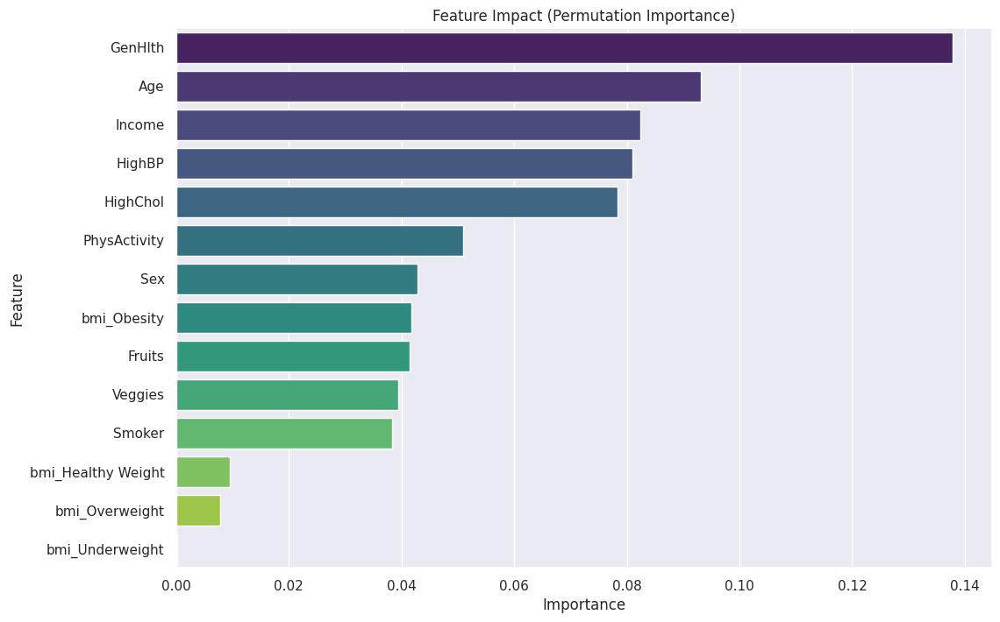

In [49]:
# Compute permutation importance
results = permutation_importance(rf_smoteenn, X_test, y_test, scoring='accuracy')

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': df.columns[1:],
    'Importance': results.importances_mean
}).sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.title('Feature Impact (Permutation Importance)')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

**XGBoost**

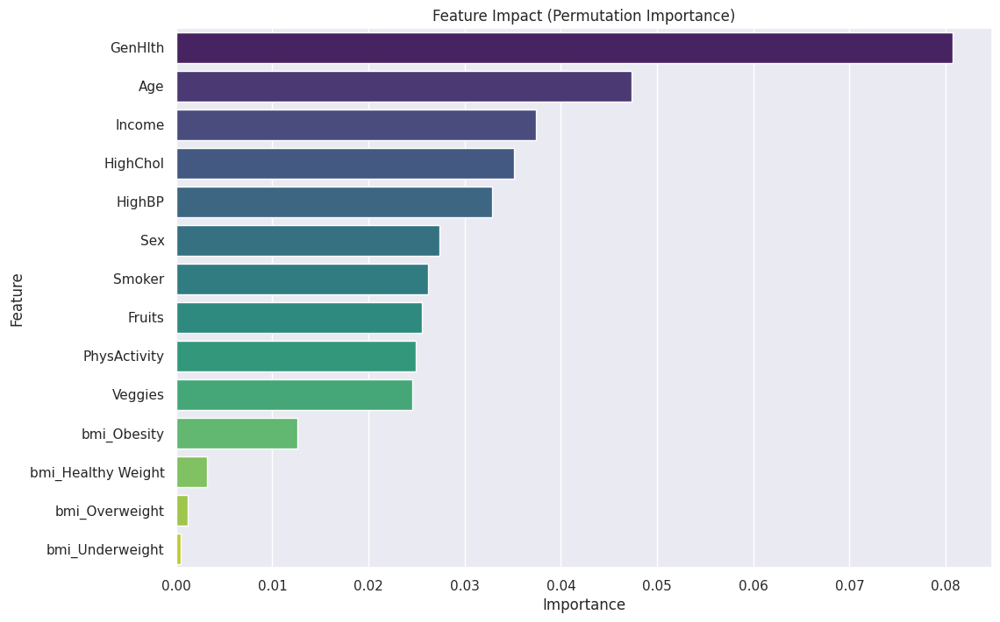

In [50]:
# Compute permutation importance
results = permutation_importance(xgboost_smoteenn, X_test, y_test, scoring='accuracy')

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': df.columns[1:],
    'Importance': results.importances_mean
}).sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.title('Feature Impact (Permutation Importance)')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

**Light Gradient Boost Machine**

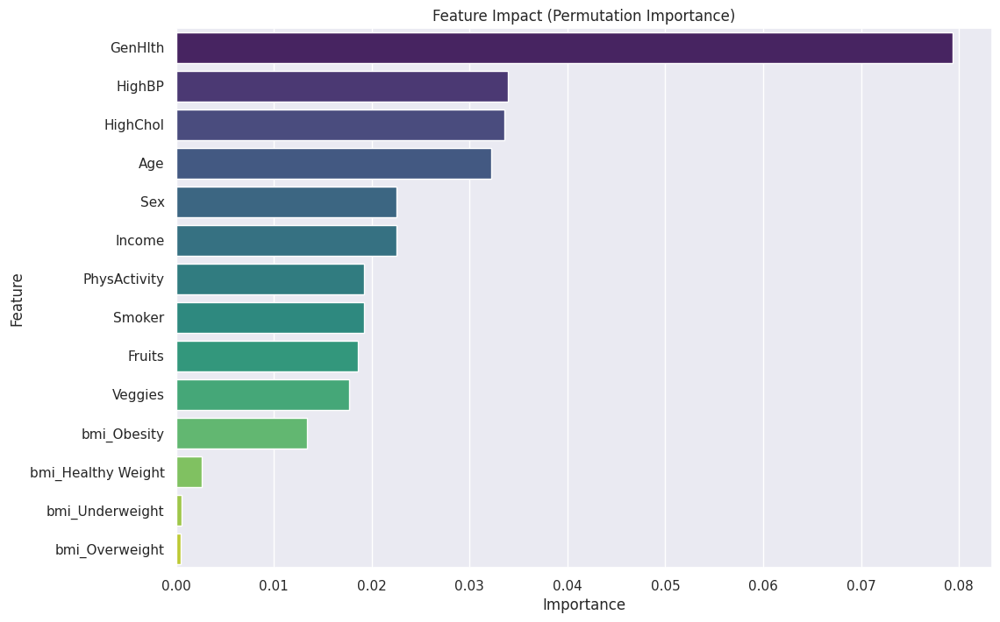

In [51]:
# Compute permutation importance
results = permutation_importance(lgbm_smoteenn, X_test, y_test, scoring='accuracy')

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': df.columns[1:],
    'Importance': results.importances_mean
}).sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.title('Feature Impact (Permutation Importance)')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

In [52]:
# Convert the resampled data to a DataFrame
X_test_smoteenn_df = pd.DataFrame(X_test, columns=df.columns[1:])

# Sample 100 instances from the resampled data
X_test_smoteenn_sampled = X_test_smoteenn_df.sample(n=100, random_state=42)

# Display the head of the sampled data
X_test_smoteenn_sampled.head()

,HighBP,HighChol,Smoker,PhysActivity,Fruits,Veggies,Sex,Age,Income,bmi_Healthy Weight,bmi_Obesity,bmi_Overweight,bmi_Underweight,GenHlth
16658,0.60,1.00,1.00,0.00,0.00,0.00,0.00,9.40,3.00,0.00,0.00,1.00,0.00,3.00
18121,0.00,0.00,1.00,1.00,1.00,1.00,1.00,6.00,8.00,0.00,0.00,1.00,0.00,3.00
13005,1.00,0.00,1.00,0.00,1.00,1.00,0.00,3.00,3.00,0.00,1.00,0.00,0.00,4.00
6526,0.00,1.00,1.00,1.00,1.00,1.00,0.00,10.00,5.00,1.00,0.00,0.00,0.00,4.00
18885,0.00,0.00,1.00,1.00,1.00,1.00,0.00,10.00,7.00,0.00,0.00,1.00,0.00,4.00


##**PDP**

**Random Forest**

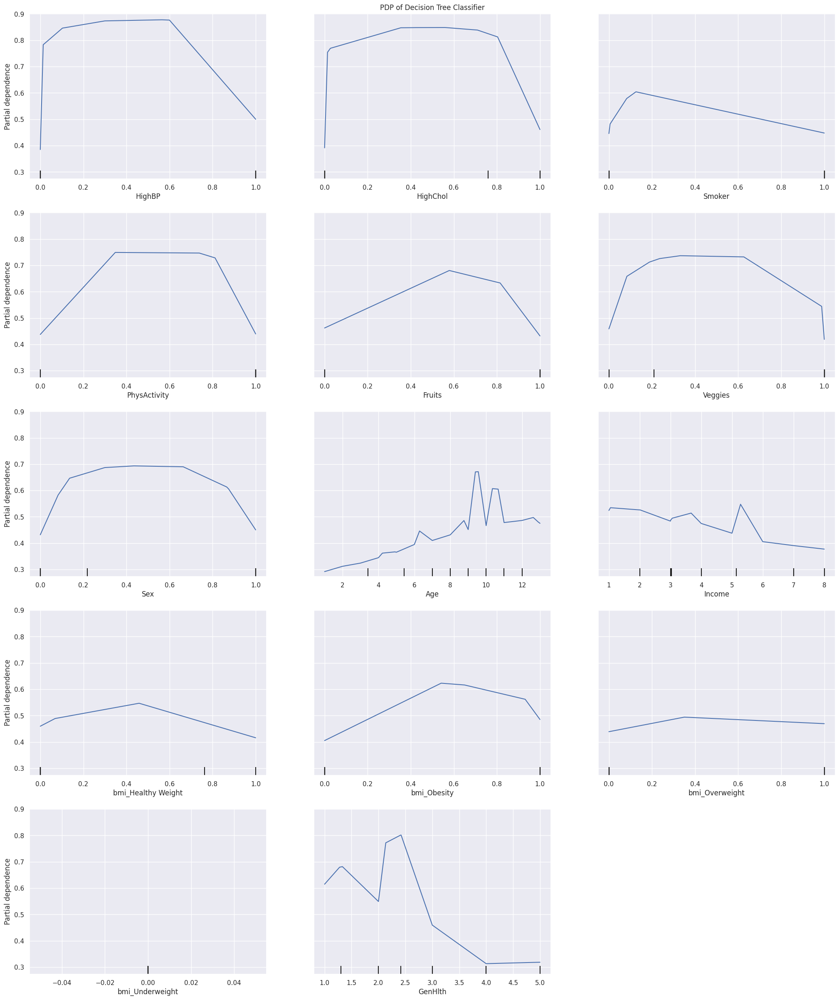

In [53]:

fig, ax = plt.subplots(figsize=(25, 30))
plt.title('PDP of Decision Tree Classifier')
PartialDependenceDisplay.from_estimator(
    estimator=rf_smoteenn,
    X=X_test_smoteenn_sampled,
    features=df.columns[1:],
    random_state=42,
    ax=ax,
)
plt.show()

**XGBoost Classifier**

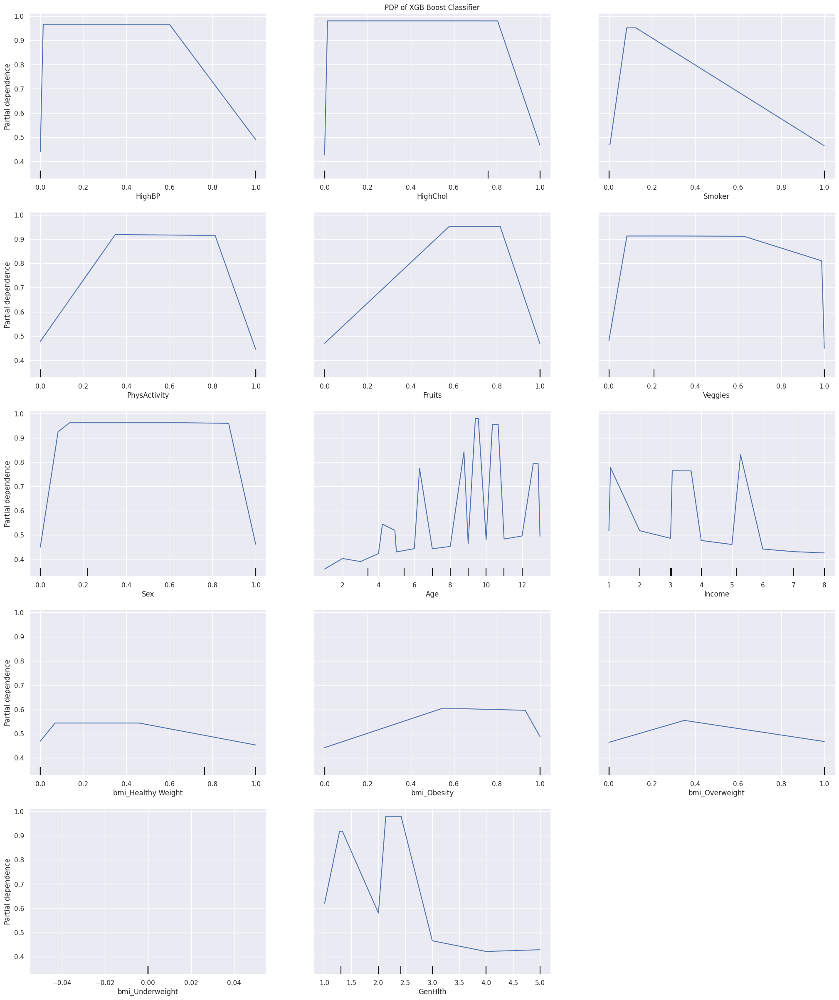

In [54]:
fig, ax = plt.subplots(figsize=(25, 30))
plt.title('PDP of XGB Boost Classifier')
PartialDependenceDisplay.from_estimator(
    estimator=xgboost_smoteenn,
    X=X_test_smoteenn_sampled,
    features=df.columns[1:],
    random_state=42,
    ax=ax,
)
plt.show()

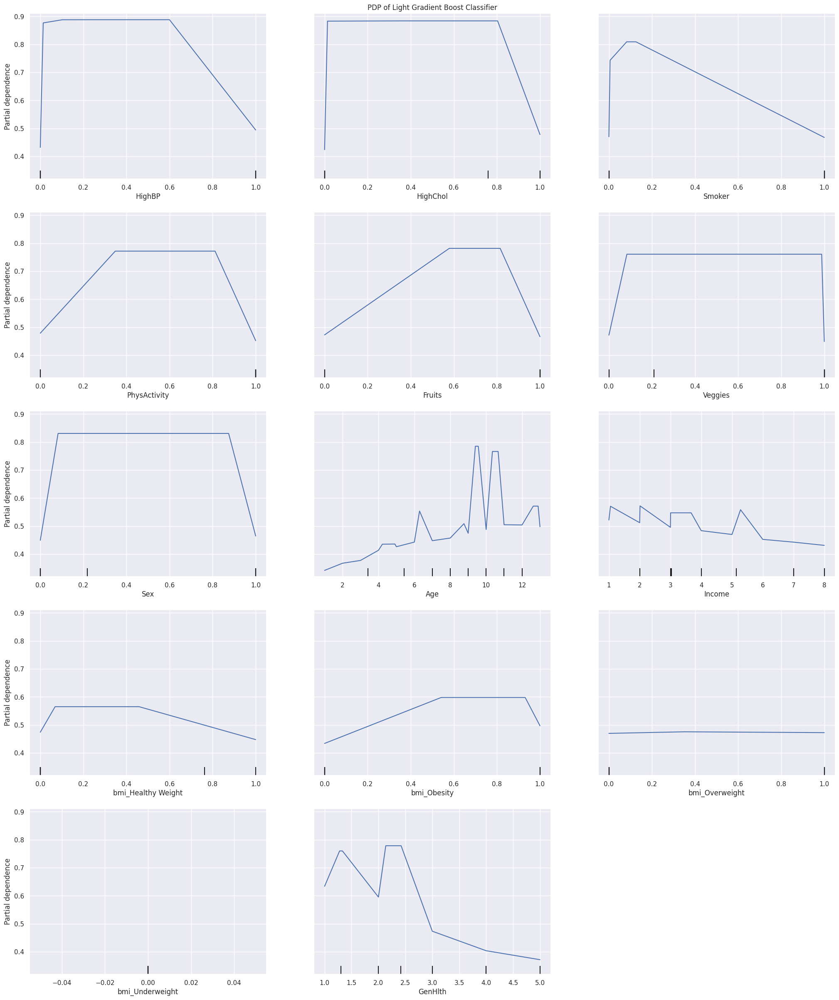

In [55]:
fig, ax = plt.subplots(figsize=(25, 30))
plt.title('PDP of Light Gradient Boost Classifier')
PartialDependenceDisplay.from_estimator(
    estimator=lgbm_smoteenn,
    X=X_test_smoteenn_sampled,
    features=df.columns[1:],
    random_state=42,
    ax=ax,
)
plt.show()

##**SHAP**

PermutationExplainer explainer: 101it [01:30,  1.02it/s]


Bar plot


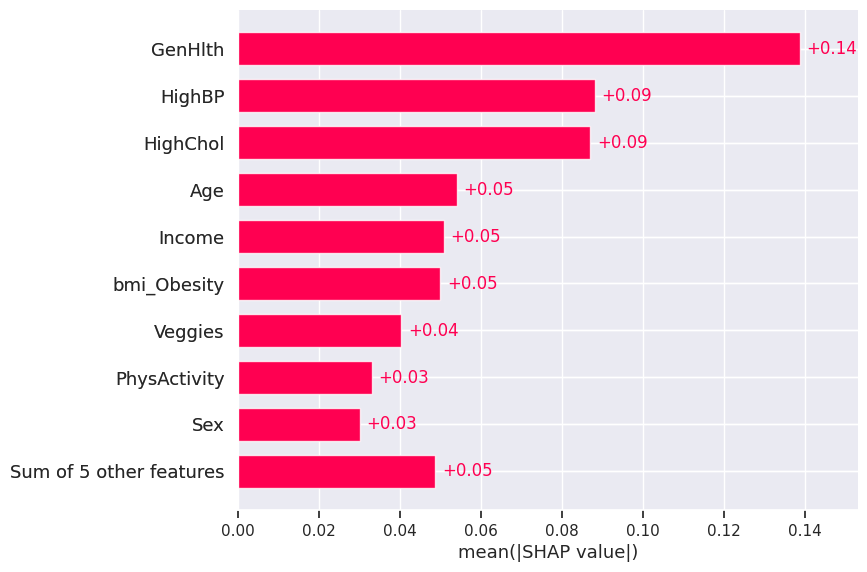

Beeswarm plot


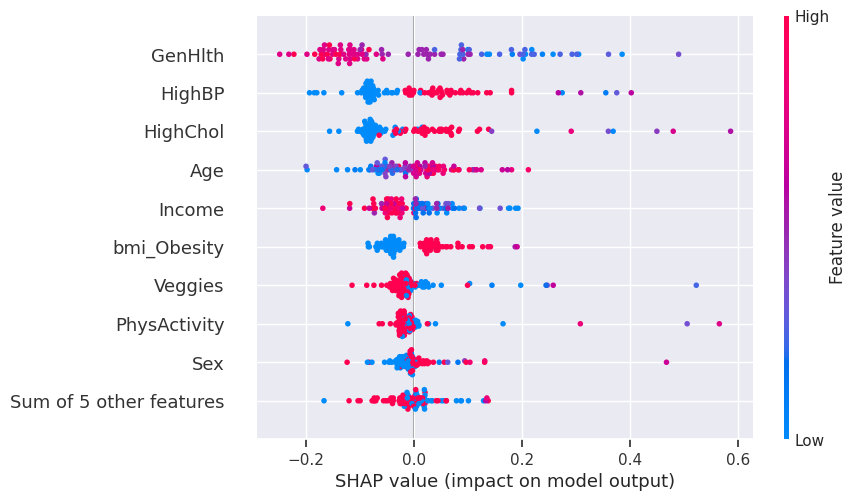

Individual plot


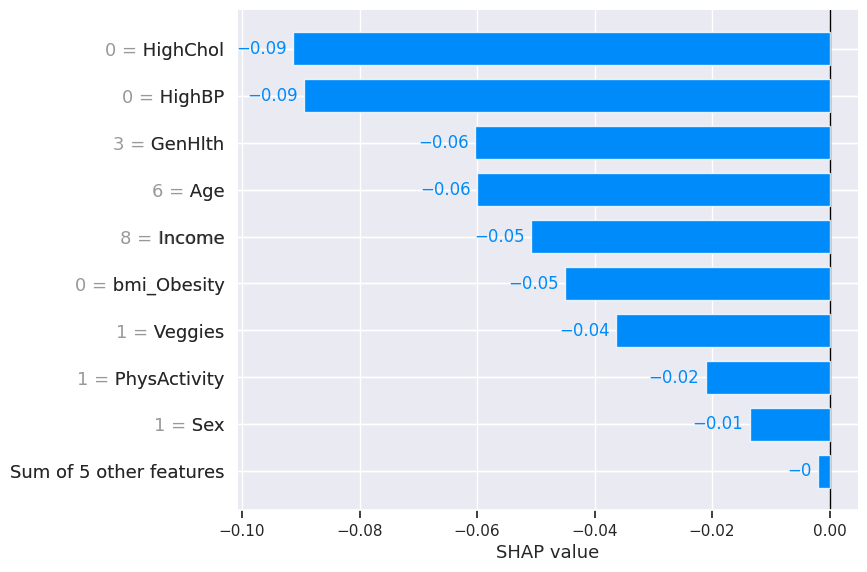

In [56]:
# Fits the explainer
explainer = shap.Explainer(rf_smoteenn.predict, X_test_smoteenn_sampled)
# Calculates the SHAP values - It takes some time so we resampled to random 100
shap_values = explainer(X_test_smoteenn_sampled)

print("Bar plot")
shap.plots.bar(shap_values)

print("Beeswarm plot")
shap.plots.beeswarm(shap_values)

print("Individual plot")
shap.plots.bar(shap_values[1])


PermutationExplainer explainer: 101it [00:18,  2.88it/s]


Bar plot


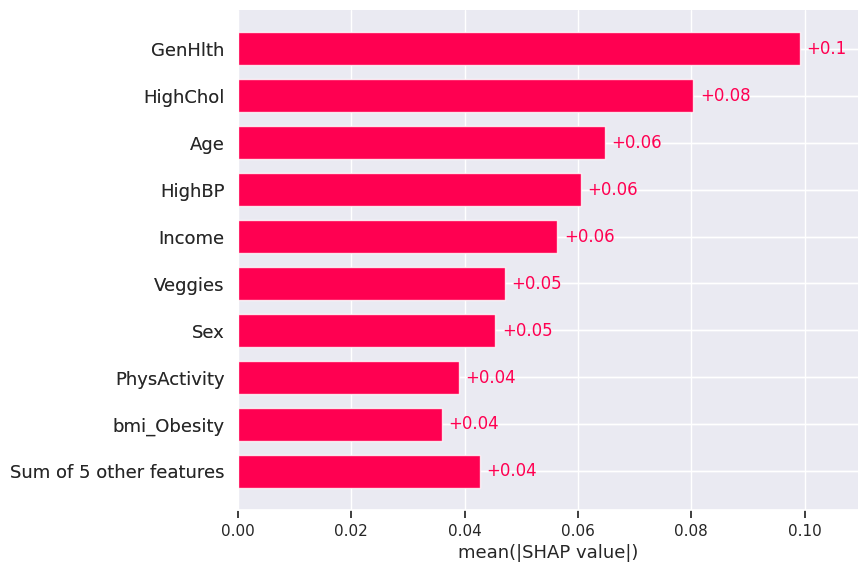

Beeswarm plot


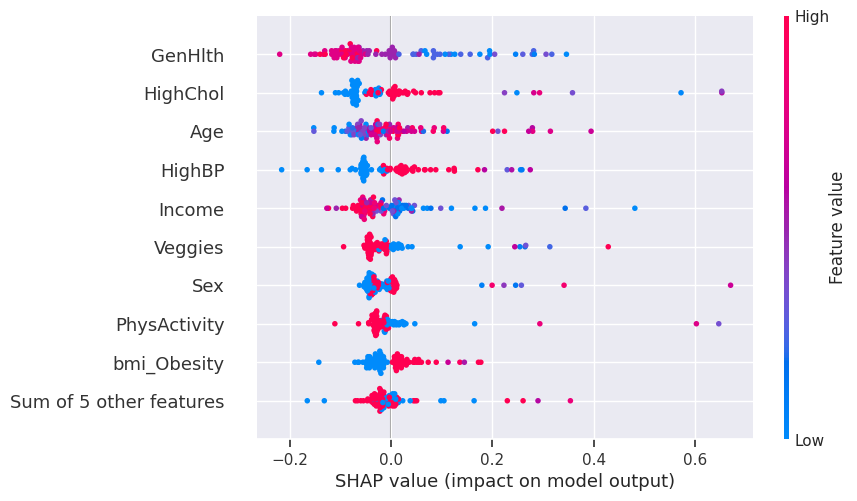

Individual plot


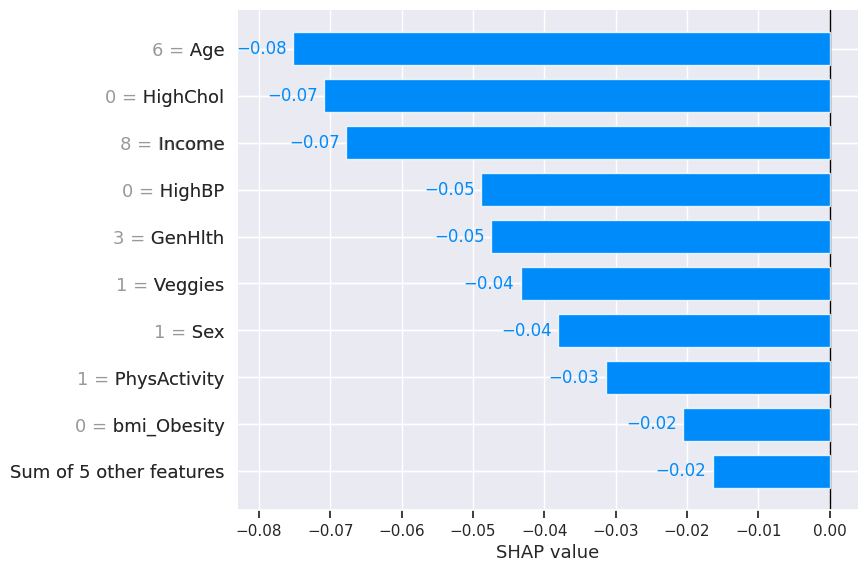

In [58]:
# Fits the explainer
explainer = shap.Explainer(xgboost_smoteenn.predict, X_test_smoteenn_sampled)
# Calculates the SHAP values - It takes some time so we resampled to random 100
shap_values = explainer(X_test_smoteenn_sampled)

print("Bar plot")
shap.plots.bar(shap_values)

print("Beeswarm plot")
shap.plots.beeswarm(shap_values)

print("Individual plot")
shap.plots.bar(shap_values[1])


Individual plot


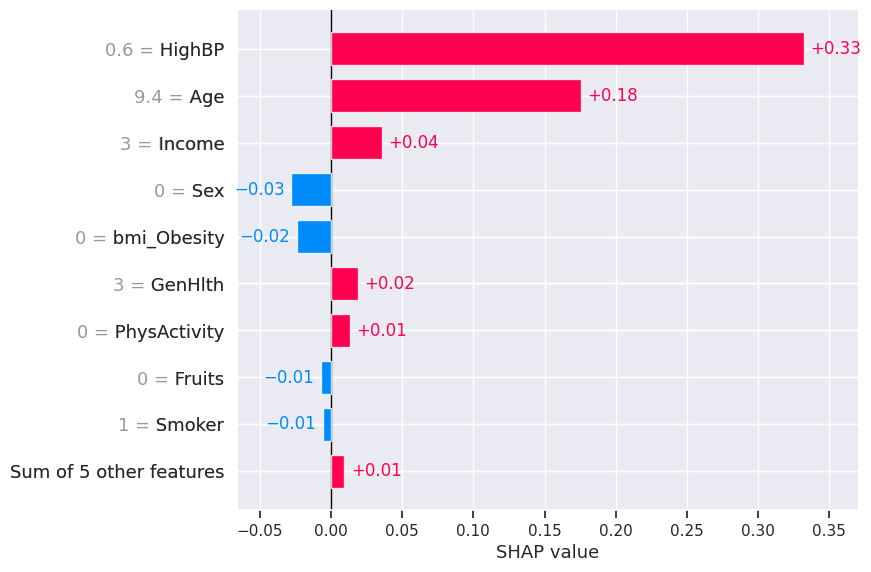

In [60]:
print("Individual plot")
shap.plots.bar(shap_values[0])

Bar plot


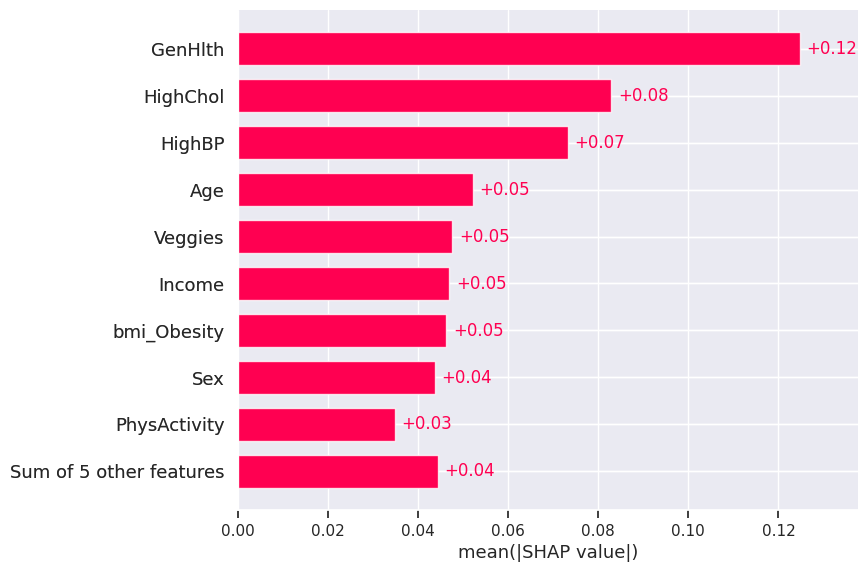

Beeswarm plot


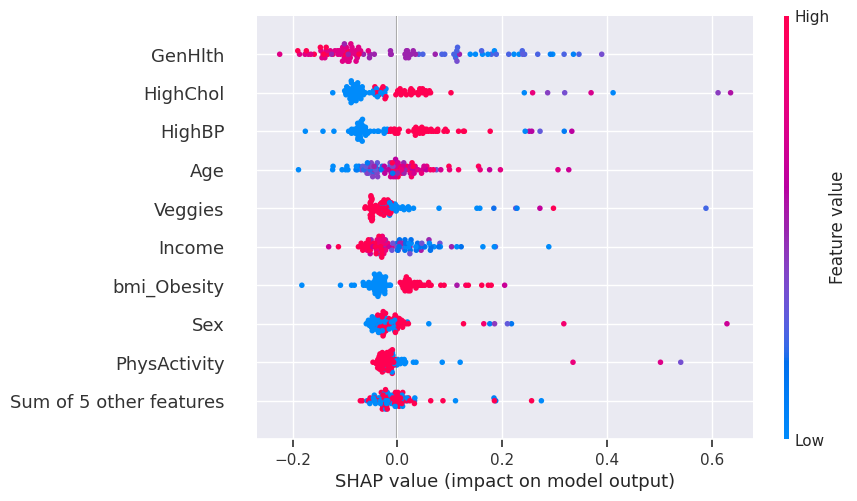

Individual plot


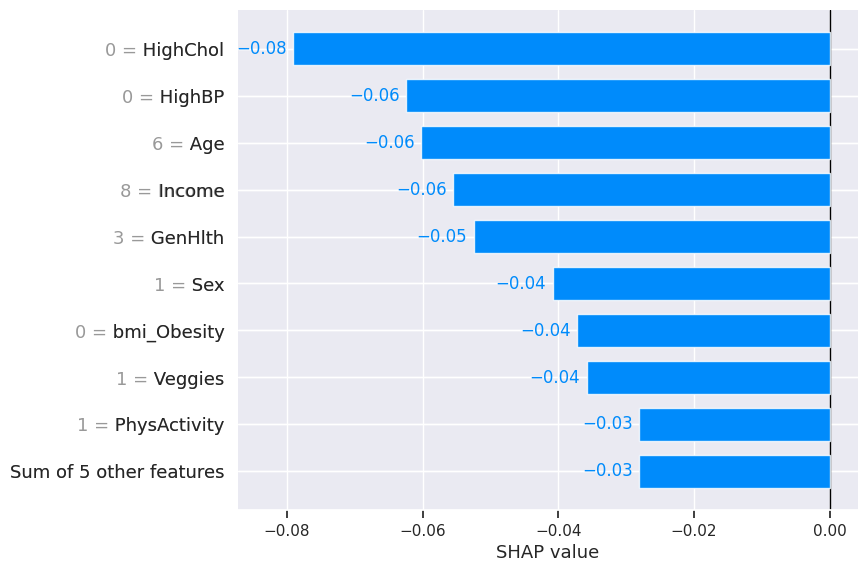

In [59]:
# Fits the explainer
explainer = shap.Explainer(lgbm_smoteenn.predict, X_test_smoteenn_sampled)
# Calculates the SHAP values - It takes some time so we resampled to random 100
shap_values = explainer(X_test_smoteenn_sampled)

print("Bar plot")
shap.plots.bar(shap_values)

print("Beeswarm plot")
shap.plots.beeswarm(shap_values)

print("Individual plot")
shap.plots.bar(shap_values[1])

shap.plots.force(shap_values[1])

SHAP Force Plot

In [61]:
X_test_smoteenn_sampled.head()

,HighBP,HighChol,Smoker,PhysActivity,Fruits,Veggies,Sex,Age,Income,bmi_Healthy Weight,bmi_Obesity,bmi_Overweight,bmi_Underweight,GenHlth
16658,0.60,1.00,1.00,0.00,0.00,0.00,0.00,9.40,3.00,0.00,0.00,1.00,0.00,3.00
18121,0.00,0.00,1.00,1.00,1.00,1.00,1.00,6.00,8.00,0.00,0.00,1.00,0.00,3.00
13005,1.00,0.00,1.00,0.00,1.00,1.00,0.00,3.00,3.00,0.00,1.00,0.00,0.00,4.00
6526,0.00,1.00,1.00,1.00,1.00,1.00,0.00,10.00,5.00,1.00,0.00,0.00,0.00,4.00
18885,0.00,0.00,1.00,1.00,1.00,1.00,0.00,10.00,7.00,0.00,0.00,1.00,0.00,4.00


##**LIME**

In [64]:
instance_idx = 1
instance = X_test[instance_idx]
instance

array([ 1.        ,  0.        ,  0.        ,  0.20136647,  1.        ,
        1.        ,  0.        , 13.        ,  2.        ,  0.        ,
        0.        ,  1.        ,  0.        ,  2.        ])

In [68]:
print("=====================")
print("xgboost")
print("=====================")
instance_idx = 1  # Change this index to explain a different instance
if y_test.iloc[instance_idx] == 0:
  print("Actual: Non-Diabetic")
else:
  print("Actual: Diabetic")

# Initialize the LIME explainerX_train_smoteenn_sampled
explainer = LimeTabularExplainer(X_train_smoteenn, feature_names=df.columns[1:],
                                 mode='classification',discretizer='decile',kernel_width=5,discretize_continuous=True,verbose=True)

# Generate explanations for a sample

# Choose an instance to explain

instance = X_test[instance_idx]



# Generate explanation
exp = explainer.explain_instance(instance, xgboost_smoteenn.predict_proba)

# Display explanation
exp.show_in_notebook(show_all=True)

xgboost
Actual: Diabetic
Intercept 1.0000095762953516
Prediction_local [0.99996596]
Right: 0.99819094


In [69]:
print("=====================")
print("Random Forest")
print("=====================")
instance_idx = 3  # Change this index to explain a different instance
if y_test.iloc[instance_idx] == 0:
  print("Actual: Non-Diabetic")
else:
  print("Actual: Diabetic")

# Initialize the LIME explainer
explainer = LimeTabularExplainer(X_train_smoteenn, feature_names=df.columns[1:],
                                 mode='classification',discretizer='decile',kernel_width=5,discretize_continuous=True,verbose=True)

# Generate explanations for a sample

instance = X_test[instance_idx]

# Generate explanation
exp = explainer.explain_instance(instance, rf_smoteenn.predict_proba)

# Display explanation
exp.show_in_notebook(show_all=True)

Random Forest
Actual: Non-Diabetic
Intercept 0.952900509955761
Prediction_local [0.72949189]
Right: 0.0


In [70]:
print("==============================")
print("Light Gradient Boost Model")
print("==============================")
# Initialize the LIME explainer
explainer = LimeTabularExplainer(X_train_smoteenn, feature_names=df.columns[1:],
                                 mode='classification',discretizer='decile',kernel_width=5,discretize_continuous=True,verbose=True)

# Generate explanations for a sample

# Choose an instance to explain
instance_idx = 1  # Change this index to explain a different instance
instance = X_test[instance_idx]

if y_test.iloc[instance_idx] == 0:
  print("Actual: Non-Diabetic")
else:
  print("Actual: Diabetic")

# Generate explanation
exp = explainer.explain_instance(instance, lgbm_smoteenn.predict_proba)

# Display explanation
exp.show_in_notebook(show_all=True)

Light Gradient Boost Model
Actual: Diabetic
Intercept 1.0004467983829763
Prediction_local [0.99863999]
Right: 0.9668452462153158
